In [ ]:
from datasets import load_dataset

dataset = load_dataset("valhalla/emoji-dataset")
print(dataset)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


DatasetDict({
    train: Dataset({
        features: ['image', 'text'],
        num_rows: 2749
    })
})


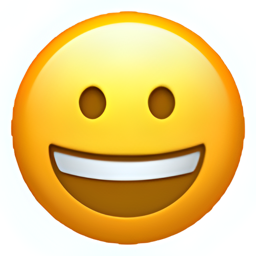

Label: grinning face


In [ ]:
from PIL import Image
import io

example = dataset['train'][0]

image = example['image']
text = example['text']

display(image)
print(f"Label: {text}")

In [ ]:
# Split the dataset into training and validation sets
train_test_split = dataset['train'].train_test_split(test_size=0.09)

train_dataset = train_test_split['train']
validation_dataset = train_test_split['test']

print("Dataset split into training and validation sets.")
print(f"Training dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(validation_dataset)}")

Dataset split into training and validation sets.
Training dataset size: 2501
Validation dataset size: 248


In [ ]:
import torch
from torch import nn
from torch.nn import functional as F

# import distributed as dist_fn

class Quantize(nn.Module):
    def __init__(self, dim, n_embed, decay=0.99, eps=1e-5):
        super().__init__()

        self.dim = dim
        self.n_embed = n_embed
        self.decay = decay
        self.eps = eps

        embed = torch.randn(dim, n_embed)
        self.register_buffer("embed", embed)
        self.register_buffer("cluster_size", torch.zeros(n_embed))
        self.register_buffer("embed_avg", embed.clone())

    def forward(self, input):
        flatten = input.reshape(-1, self.dim)
        dist = (
            flatten.pow(2).sum(1, keepdim=True)
            - 2 * flatten @ self.embed
            + self.embed.pow(2).sum(0, keepdim=True)
        )
        _, embed_ind = (-dist).max(1)
        embed_onehot = F.one_hot(embed_ind, self.n_embed).type(flatten.dtype)
        embed_ind = embed_ind.view(*input.shape[:-1])
        quantize = self.embed_code(embed_ind)

        if self.training:
            embed_onehot_sum = embed_onehot.sum(0)
            embed_sum = flatten.transpose(0, 1) @ embed_onehot

            # dist_fn.all_reduce(embed_onehot_sum)
            # dist_fn.all_reduce(embed_sum)

            self.cluster_size.data.mul_(self.decay).add_(
                embed_onehot_sum, alpha=1 - self.decay
            )
            self.embed_avg.data.mul_(self.decay).add_(embed_sum, alpha=1 - self.decay)
            n = self.cluster_size.sum()
            cluster_size = (
                (self.cluster_size + self.eps) / (n + self.n_embed * self.eps) * n
            )
            embed_normalized = self.embed_avg / cluster_size.unsqueeze(0)
            self.embed.data.copy_(embed_normalized)

        diff = (quantize.detach() - input).pow(2).mean()
        quantize = input + (quantize - input).detach()

        return quantize, diff, embed_ind

    def embed_code(self, embed_id):
        return F.embedding(embed_id, self.embed.transpose(0, 1))


class ResBlock(nn.Module):
    def __init__(self, in_channel, channel):
        super().__init__()

        self.conv = nn.Sequential(
            nn.ReLU(),
            nn.Conv2d(in_channel, channel, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(channel, in_channel, 1),
        )

    def forward(self, input):
        out = self.conv(input)
        out += input

        return out


class Encoder(nn.Module):
    def __init__(self, in_channel, channel, n_res_block, n_res_channel, stride):
        super().__init__()

        if stride == 4:
            blocks = [
                nn.Conv2d(in_channel, channel // 2, 4, stride=2, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(channel // 2, channel, 4, stride=2, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(channel, channel, 3, padding=1),
            ]

        elif stride == 2:
            blocks = [
                nn.Conv2d(in_channel, channel // 2, 4, stride=2, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(channel // 2, channel, 3, padding=1),
            ]

        for i in range(n_res_block):
            blocks.append(ResBlock(channel, n_res_channel))

        blocks.append(nn.ReLU(inplace=True))

        self.blocks = nn.Sequential(*blocks)

    def forward(self, input):
        return self.blocks(input)


class Decoder(nn.Module):
    def __init__(
        self, in_channel, out_channel, channel, n_res_block, n_res_channel, stride
    ):
        super().__init__()

        blocks = [nn.Conv2d(in_channel, channel, 3, padding=1)]

        for i in range(n_res_block):
            blocks.append(ResBlock(channel, n_res_channel))

        blocks.append(nn.ReLU(inplace=True))

        if stride == 4:
            blocks.extend(
                [
                    nn.ConvTranspose2d(channel, channel // 2, 4, stride=2, padding=1),
                    nn.ReLU(inplace=True),
                    nn.ConvTranspose2d(
                        channel // 2, out_channel, 4, stride=2, padding=1
                    ),
                ]
            )

        elif stride == 2:
            blocks.append(
                nn.ConvTranspose2d(channel, out_channel, 4, stride=2, padding=1)
            )

        self.blocks = nn.Sequential(*blocks)

    def forward(self, input):
        return self.blocks(input)


class VQVAE(nn.Module):
    def __init__(
        self,
        in_channel=3,
        channel=128,
        n_res_block=2,
        n_res_channel=32,
        embed_dim=64,
        n_embed=512,
        decay=0.99,
    ):
        super().__init__()

        self.enc_b = Encoder(in_channel, channel, n_res_block, n_res_channel, stride=4)
        self.enc_t = Encoder(channel, channel, n_res_block, n_res_channel, stride=2)
        self.quantize_conv_t = nn.Conv2d(channel, embed_dim, 1)
        self.quantize_t = Quantize(embed_dim, n_embed)
        self.dec_t = Decoder(
            embed_dim, embed_dim, channel, n_res_block, n_res_channel, stride=2
        )
        self.quantize_conv_b = nn.Conv2d(embed_dim + channel, embed_dim, 1)
        self.quantize_b = Quantize(embed_dim, n_embed)
        self.upsample_t = nn.ConvTranspose2d(
            embed_dim, embed_dim, 4, stride=2, padding=1
        )
        self.dec = Decoder(
            embed_dim + embed_dim,
            in_channel,
            channel,
            n_res_block,
            n_res_channel,
            stride=4,
        )

    def forward(self, input):
        quant_t, quant_b, diff, _, _ = self.encode(input)
        dec = self.decode(quant_t, quant_b)

        return dec, diff

    def encode(self, input):
        enc_b = self.enc_b(input)
        enc_t = self.enc_t(enc_b)

        quant_t = self.quantize_conv_t(enc_t).permute(0, 2, 3, 1)
        quant_t, diff_t, id_t = self.quantize_t(quant_t)
        quant_t = quant_t.permute(0, 3, 1, 2)
        diff_t = diff_t.unsqueeze(0)

        dec_t = self.dec_t(quant_t)
        enc_b = torch.cat([dec_t, enc_b], 1)

        quant_b = self.quantize_conv_b(enc_b).permute(0, 2, 3, 1)
        quant_b, diff_b, id_b = self.quantize_b(quant_b)
        quant_b = quant_b.permute(0, 3, 1, 2)
        diff_b = diff_b.unsqueeze(0)

        return quant_t, quant_b, diff_t + diff_b, id_t, id_b

    def decode(self, quant_t, quant_b):
        upsample_t = self.upsample_t(quant_t)
        quant = torch.cat([upsample_t, quant_b], 1)
        dec = self.dec(quant)

        return dec

    def decode_code(self, code_t, code_b):
        quant_t = self.quantize_t.embed_code(code_t)
        quant_t = quant_t.permute(0, 3, 1, 2)
        quant_b = self.quantize_b.embed_code(code_b)
        quant_b = quant_b.permute(0, 3, 1, 2)

        dec = self.decode(quant_t, quant_b)

        return dec

## Data preprocessing


In [ ]:
from torchvision import transforms
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

train_dataset = train_dataset.with_transform(lambda examples: {'image': [transform(img) for img in examples['image']], 'text': examples['text']})
validation_dataset = validation_dataset.with_transform(lambda examples: {'image': [transform(img) for img in examples['image']], 'text': examples['text']})


first_image_tensor = train_dataset[0]['image']
print(f"Shape of the first transformed image tensor in the training set: {first_image_tensor.shape}")
print(f"First 5x5 patch of the first channel of the first transformed image tensor in the training set:\n{first_image_tensor[0, :5, :5]}")

first_image_tensor_val = validation_dataset[0]['image']
print(f"Shape of the first transformed image tensor in the validation set: {first_image_tensor_val.shape}")
print(f"First 5x5 patch of the first channel of the first transformed image tensor in the validation set:\n{first_image_tensor_val[0, :5, :5]}")

Shape of the first transformed image tensor in the training set: torch.Size([3, 64, 64])
First 5x5 patch of the first channel of the first transformed image tensor in the training set:
tensor([[0.9608, 0.9529, 0.9451, 0.9451, 0.9529],
        [0.9529, 0.9451, 0.9373, 0.9451, 0.9608],
        [0.9451, 0.9451, 0.9529, 0.9686, 0.9529],
        [0.9373, 0.9529, 0.9686, 0.9059, 0.4588],
        [0.9451, 0.9608, 0.9608, 0.4824, 0.0431]])
Shape of the first transformed image tensor in the validation set: torch.Size([3, 64, 64])
First 5x5 patch of the first channel of the first transformed image tensor in the validation set:
tensor([[1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.]])


In [ ]:
batch_size = 32

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f"Batch size: {batch_size}")
print(f"Device: {device}")

Batch size: 32
Device: cuda


## Create dataloader



In [ ]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_dataloader = DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)

for batch in train_dataloader:
    images = batch['image']
    print(f"Shape of image tensor in a training batch: {images.shape}")
    break

for batch in validation_dataloader:
    images = batch['image']
    print(f"Shape of image tensor in a validation batch: {images.shape}")
    break

Shape of image tensor in a training batch: torch.Size([32, 3, 64, 64])
Shape of image tensor in a validation batch: torch.Size([32, 3, 64, 64])


## Instantiate model, optimizer, and loss function


In [ ]:
# The input channel is 3 for RGB images.

model = VQVAE(
    in_channel=3,
    channel=128,
    n_res_block=4,
    n_res_channel=64,
    embed_dim=64,
    n_embed=512,
    decay=0.99
)


model.to(device)


optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=1e-5,
    betas=(0.9, 0.999),
    weight_decay=0.01
)

criterion = nn.MSELoss()

print("VQVAE model, optimizer, and loss function defined.")

VQVAE model, optimizer, and loss function defined.


In [ ]:
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=400,
    eta_min=1e-6
)


In [ ]:
# Visualize original vs reconstructed images
def visualize_reconstructions(model, val_loader, device, num_samples=8):
    model.eval()

    import matplotlib.pyplot as plt

    batch = next(iter(val_loader))
    images = batch['image'][:num_samples].to(device)

    with torch.no_grad():
        reconstructed, _ = model(images)

    images = images.cpu() * 0.5 + 0.5
    reconstructed = reconstructed.cpu() * 0.5 + 0.5

    fig, axes = plt.subplots(2, num_samples, figsize=(num_samples*2, 4))

    for i in range(num_samples):
        # Original
        axes[0, i].imshow(images[i].permute(1, 2, 0).clamp(0, 1))
        axes[0, i].axis('off')
        if i == 0:
            axes[0, i].set_title('Original', fontsize=10)

        # Reconstructed
        axes[1, i].imshow(reconstructed[i].permute(1, 2, 0).clamp(0, 1))
        axes[1, i].axis('off')
        if i == 0:
            axes[1, i].set_title('Reconstructed', fontsize=10)

    plt.tight_layout()
    plt.show()

    model.train()

## Training loop


/usr/local/lib/python3.12/dist-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `PeakSignalNoiseRatio` from `torchmetrics` was deprecated and will be removed in 2.0. Import `PeakSignalNoiseRatio` from `torchmetrics.image` instead.
  _future_warning(
/usr/local/lib/python3.12/dist-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `StructuralSimilarityIndexMeasure` from `torchmetrics` was deprecated and will be removed in 2.0. Import `StructuralSimilarityIndexMeasure` from `torchmetrics.image` instead.
  _future_warning(


Epoch [1/500] Loss: 1.2461 | Recon: 0.4172 | VQ: 0.8289 | Top: 1/512 | Bottom: 1/512 | LR: 0.000300


Epoch [2/500] Loss: 0.6262 | Recon: 0.3477 | VQ: 0.2785 | Top: 1/512 | Bottom: 1/512 | LR: 0.000300


Epoch [3/500] Loss: 0.7640 | Recon: 0.3386 | VQ: 0.4254 | Top: 1/512 | Bottom: 1/512 | LR: 0.000300


Epoch [4/500] Loss: 0.7640 | Recon: 0.3410 | VQ: 0.4230 | Top: 1/512 | Bottom: 1/512 | LR: 0.000300


Epoch [5/500] Loss: 0.6684 | Recon: 0.3402 | VQ: 0.3282 | Top: 1/512 | Bottom: 1/512 | LR: 0.000300


Epoch [6/500] Loss: 0.7987 | Recon: 0.3818 | VQ: 0.4169 | Top: 1/512 | Bottom: 2/512 | LR: 0.000300


Epoch [7/500] Loss: 0.2537 | Recon: 0.1755 | VQ: 0.0781 | Top: 1/512 | Bottom: 2/512 | LR: 0.000300


Epoch [8/500] Loss: 0.1325 | Recon: 0.1172 | VQ: 0.0152 | Top: 1/512 | Bottom: 5/512 | LR: 0.000300


Epoch [9/500] Loss: 0.0857 | Recon: 0.0784 | VQ: 0.0073 | Top: 4/512 | Bottom: 17/512 | LR: 0.000300


Epoch [10/500] Loss: 0.0579 | Recon: 0.0531 | VQ: 0.0048 | Top: 5/512 | Bottom: 23/512 | LR: 0.000300


Epoch [11/500] Loss: 0.0498 | Recon: 0.0464 | VQ: 0.0033 | Top: 5/512 | Bottom: 23/512 | LR: 0.000299


Epoch [12/500] Loss: 0.0454 | Recon: 0.0424 | VQ: 0.0030 | Top: 5/512 | Bottom: 23/512 | LR: 0.000299


Epoch [13/500] Loss: 0.0423 | Recon: 0.0394 | VQ: 0.0029 | Top: 5/512 | Bottom: 23/512 | LR: 0.000299


Epoch [14/500] Loss: 0.0399 | Recon: 0.0366 | VQ: 0.0033 | Top: 5/512 | Bottom: 23/512 | LR: 0.000299


Epoch [15/500] Loss: 0.0365 | Recon: 0.0331 | VQ: 0.0034 | Top: 5/512 | Bottom: 28/512 | LR: 0.000299


Epoch [16/500] Loss: 0.0352 | Recon: 0.0317 | VQ: 0.0034 | Top: 5/512 | Bottom: 29/512 | LR: 0.000299


Epoch [17/500] Loss: 0.0323 | Recon: 0.0291 | VQ: 0.0032 | Top: 5/512 | Bottom: 29/512 | LR: 0.000299


Epoch [18/500] Loss: 0.0310 | Recon: 0.0278 | VQ: 0.0033 | Top: 5/512 | Bottom: 29/512 | LR: 0.000299


Epoch [19/500] Loss: 0.0297 | Recon: 0.0262 | VQ: 0.0035 | Top: 5/512 | Bottom: 30/512 | LR: 0.000298


Epoch [20/500] Loss: 0.0292 | Recon: 0.0256 | VQ: 0.0036 | Top: 5/512 | Bottom: 33/512 | LR: 0.000298


Creating feature extractor "inception-v3-compat" with features ['2048']
Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 272MB/s]
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmp76z7ozeg" with extensions png,jpg,jpeg
Found 248 samples
/usr/local/lib/python3.12/dist-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWa


Validation Metrics (Epoch 20):
  Loss: 0.0288 | Recon: 0.0251 | VQ: 0.0037
  MSE: 0.025070 | PSNR: 25.5509 dB | SSIM: 0.7834 | FID: 180.9610

 New best FID: 180.96 - Model saved!


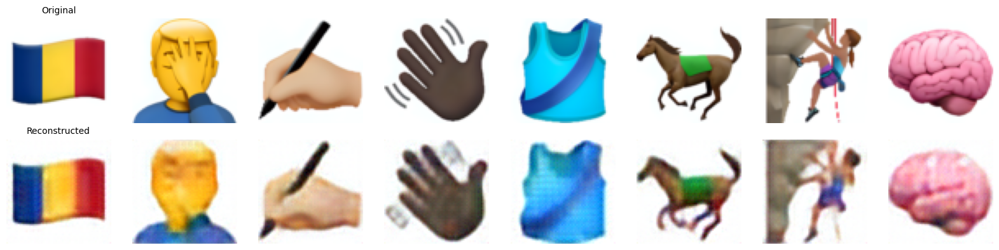

Epoch [21/500] Loss: 0.0278 | Recon: 0.0243 | VQ: 0.0035 | Top: 5/512 | Bottom: 33/512 | LR: 0.000298


Epoch [22/500] Loss: 0.0272 | Recon: 0.0237 | VQ: 0.0035 | Top: 5/512 | Bottom: 33/512 | LR: 0.000298


Epoch [23/500] Loss: 0.0262 | Recon: 0.0227 | VQ: 0.0035 | Top: 5/512 | Bottom: 34/512 | LR: 0.000298


Epoch [24/500] Loss: 0.0254 | Recon: 0.0219 | VQ: 0.0034 | Top: 5/512 | Bottom: 34/512 | LR: 0.000297


Epoch [25/500] Loss: 0.0247 | Recon: 0.0213 | VQ: 0.0034 | Top: 5/512 | Bottom: 35/512 | LR: 0.000297


Epoch [26/500] Loss: 0.0242 | Recon: 0.0208 | VQ: 0.0034 | Top: 5/512 | Bottom: 35/512 | LR: 0.000297


Epoch [27/500] Loss: 0.0236 | Recon: 0.0202 | VQ: 0.0035 | Top: 5/512 | Bottom: 36/512 | LR: 0.000297


Epoch [28/500] Loss: 0.0232 | Recon: 0.0197 | VQ: 0.0035 | Top: 5/512 | Bottom: 36/512 | LR: 0.000296


Epoch [29/500] Loss: 0.0228 | Recon: 0.0193 | VQ: 0.0035 | Top: 5/512 | Bottom: 37/512 | LR: 0.000296


Epoch [30/500] Loss: 0.0224 | Recon: 0.0189 | VQ: 0.0034 | Top: 5/512 | Bottom: 40/512 | LR: 0.000296


Epoch [31/500] Loss: 0.0218 | Recon: 0.0185 | VQ: 0.0033 | Top: 5/512 | Bottom: 41/512 | LR: 0.000296


Epoch [32/500] Loss: 0.0215 | Recon: 0.0182 | VQ: 0.0033 | Top: 5/512 | Bottom: 42/512 | LR: 0.000295


Epoch [33/500] Loss: 0.0211 | Recon: 0.0178 | VQ: 0.0033 | Top: 5/512 | Bottom: 43/512 | LR: 0.000295


Epoch [34/500] Loss: 0.0207 | Recon: 0.0174 | VQ: 0.0033 | Top: 5/512 | Bottom: 46/512 | LR: 0.000295


Epoch [35/500] Loss: 0.0202 | Recon: 0.0170 | VQ: 0.0032 | Top: 5/512 | Bottom: 48/512 | LR: 0.000294


Epoch [36/500] Loss: 0.0199 | Recon: 0.0169 | VQ: 0.0031 | Top: 5/512 | Bottom: 50/512 | LR: 0.000294


Epoch [37/500] Loss: 0.0195 | Recon: 0.0164 | VQ: 0.0030 | Top: 6/512 | Bottom: 53/512 | LR: 0.000294


Epoch [38/500] Loss: 0.0192 | Recon: 0.0163 | VQ: 0.0029 | Top: 6/512 | Bottom: 56/512 | LR: 0.000293


Epoch [39/500] Loss: 0.0187 | Recon: 0.0159 | VQ: 0.0028 | Top: 6/512 | Bottom: 57/512 | LR: 0.000293


Epoch [40/500] Loss: 0.0183 | Recon: 0.0156 | VQ: 0.0027 | Top: 6/512 | Bottom: 59/512 | LR: 0.000293


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmprobbpwak" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmpagxenhxa" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 131.31879763572346



Validation Metrics (Epoch 40):
  Loss: 0.0185 | Recon: 0.0158 | VQ: 0.0027
  MSE: 0.015782 | PSNR: 27.5608 dB | SSIM: 0.8427 | FID: 131.3188

 New best FID: 131.32 - Model saved!


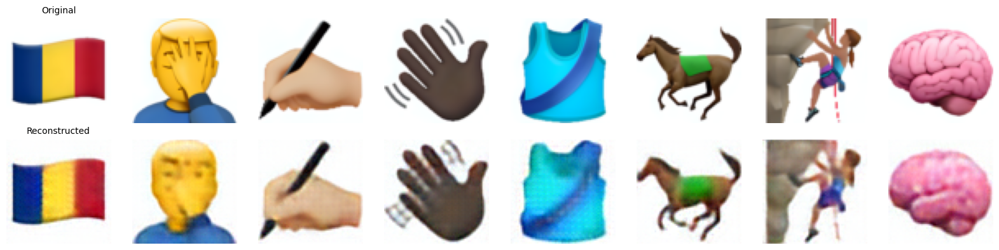

Epoch [41/500] Loss: 0.0180 | Recon: 0.0154 | VQ: 0.0026 | Top: 6/512 | Bottom: 62/512 | LR: 0.000292


Epoch [42/500] Loss: 0.0177 | Recon: 0.0151 | VQ: 0.0026 | Top: 6/512 | Bottom: 64/512 | LR: 0.000292


Epoch [43/500] Loss: 0.0175 | Recon: 0.0149 | VQ: 0.0025 | Top: 6/512 | Bottom: 66/512 | LR: 0.000292


Epoch [44/500] Loss: 0.0171 | Recon: 0.0146 | VQ: 0.0025 | Top: 6/512 | Bottom: 67/512 | LR: 0.000291


Epoch [45/500] Loss: 0.0174 | Recon: 0.0149 | VQ: 0.0024 | Top: 6/512 | Bottom: 70/512 | LR: 0.000291


Epoch [46/500] Loss: 0.0166 | Recon: 0.0142 | VQ: 0.0024 | Top: 6/512 | Bottom: 71/512 | LR: 0.000290


Epoch [47/500] Loss: 0.0164 | Recon: 0.0140 | VQ: 0.0024 | Top: 7/512 | Bottom: 74/512 | LR: 0.000290


Epoch [48/500] Loss: 0.0161 | Recon: 0.0138 | VQ: 0.0023 | Top: 7/512 | Bottom: 78/512 | LR: 0.000290


Epoch [49/500] Loss: 0.0159 | Recon: 0.0136 | VQ: 0.0022 | Top: 7/512 | Bottom: 81/512 | LR: 0.000289


Epoch [50/500] Loss: 0.0156 | Recon: 0.0134 | VQ: 0.0022 | Top: 7/512 | Bottom: 84/512 | LR: 0.000289
Checkpoint saved at epoch 50


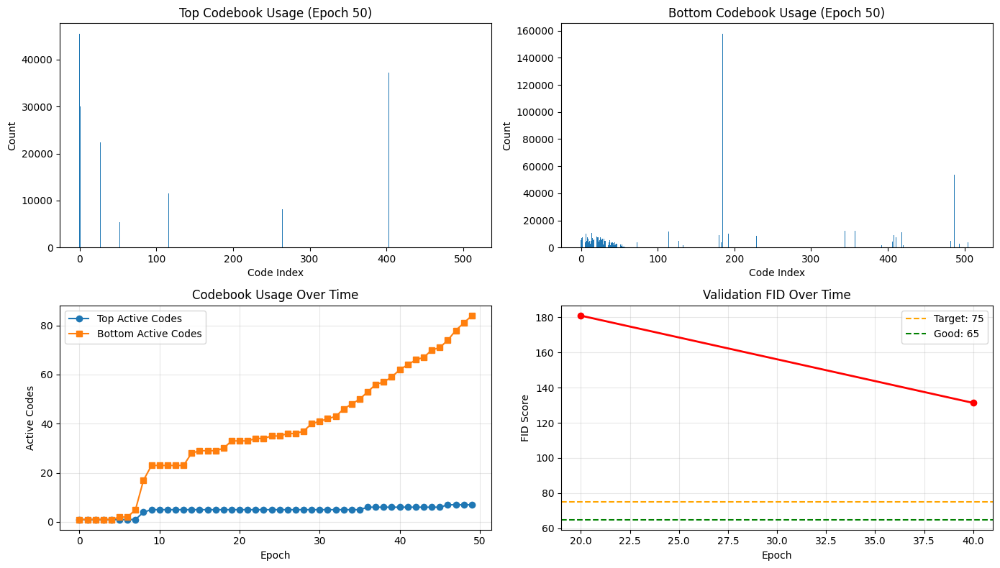

Epoch [51/500] Loss: 0.0155 | Recon: 0.0133 | VQ: 0.0022 | Top: 7/512 | Bottom: 89/512 | LR: 0.000288


Epoch [52/500] Loss: 0.0152 | Recon: 0.0131 | VQ: 0.0021 | Top: 7/512 | Bottom: 90/512 | LR: 0.000288


Epoch [53/500] Loss: 0.0150 | Recon: 0.0129 | VQ: 0.0021 | Top: 7/512 | Bottom: 91/512 | LR: 0.000287


Epoch [54/500] Loss: 0.0148 | Recon: 0.0127 | VQ: 0.0021 | Top: 7/512 | Bottom: 93/512 | LR: 0.000287


Epoch [55/500] Loss: 0.0147 | Recon: 0.0126 | VQ: 0.0021 | Top: 8/512 | Bottom: 98/512 | LR: 0.000286


Epoch [56/500] Loss: 0.0146 | Recon: 0.0125 | VQ: 0.0021 | Top: 7/512 | Bottom: 99/512 | LR: 0.000286


Epoch [57/500] Loss: 0.0146 | Recon: 0.0125 | VQ: 0.0021 | Top: 8/512 | Bottom: 101/512 | LR: 0.000285


Epoch [58/500] Loss: 0.0142 | Recon: 0.0121 | VQ: 0.0022 | Top: 8/512 | Bottom: 103/512 | LR: 0.000285


Epoch [59/500] Loss: 0.0142 | Recon: 0.0120 | VQ: 0.0022 | Top: 7/512 | Bottom: 105/512 | LR: 0.000284


Epoch [60/500] Loss: 0.0144 | Recon: 0.0121 | VQ: 0.0023 | Top: 8/512 | Bottom: 107/512 | LR: 0.000284


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmpadr84bsg" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmpv68ck7cf" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 113.4734734494026



Validation Metrics (Epoch 60):
  Loss: 0.0155 | Recon: 0.0133 | VQ: 0.0023
  MSE: 0.013242 | PSNR: 28.3229 dB | SSIM: 0.8596 | FID: 113.4735

 New best FID: 113.47 - Model saved!


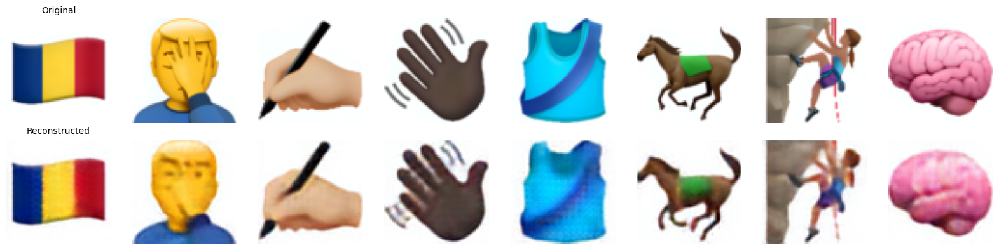

Epoch [61/500] Loss: 0.0141 | Recon: 0.0118 | VQ: 0.0023 | Top: 8/512 | Bottom: 109/512 | LR: 0.000283


Epoch [62/500] Loss: 0.0141 | Recon: 0.0118 | VQ: 0.0023 | Top: 7/512 | Bottom: 110/512 | LR: 0.000283


Epoch [63/500] Loss: 0.0139 | Recon: 0.0116 | VQ: 0.0023 | Top: 8/512 | Bottom: 111/512 | LR: 0.000282


Epoch [64/500] Loss: 0.0137 | Recon: 0.0114 | VQ: 0.0023 | Top: 7/512 | Bottom: 116/512 | LR: 0.000282


Epoch [65/500] Loss: 0.0135 | Recon: 0.0112 | VQ: 0.0023 | Top: 8/512 | Bottom: 119/512 | LR: 0.000281


Epoch [66/500] Loss: 0.0135 | Recon: 0.0113 | VQ: 0.0022 | Top: 8/512 | Bottom: 121/512 | LR: 0.000280


Epoch [67/500] Loss: 0.0135 | Recon: 0.0113 | VQ: 0.0022 | Top: 8/512 | Bottom: 122/512 | LR: 0.000280


Epoch [68/500] Loss: 0.0132 | Recon: 0.0110 | VQ: 0.0022 | Top: 9/512 | Bottom: 125/512 | LR: 0.000279


Epoch [69/500] Loss: 0.0130 | Recon: 0.0108 | VQ: 0.0022 | Top: 9/512 | Bottom: 126/512 | LR: 0.000279


Epoch [70/500] Loss: 0.0129 | Recon: 0.0108 | VQ: 0.0021 | Top: 9/512 | Bottom: 127/512 | LR: 0.000278


Epoch [71/500] Loss: 0.0127 | Recon: 0.0106 | VQ: 0.0021 | Top: 9/512 | Bottom: 129/512 | LR: 0.000277


Epoch [72/500] Loss: 0.0128 | Recon: 0.0106 | VQ: 0.0022 | Top: 9/512 | Bottom: 132/512 | LR: 0.000277


Epoch [73/500] Loss: 0.0126 | Recon: 0.0105 | VQ: 0.0021 | Top: 9/512 | Bottom: 135/512 | LR: 0.000276


Epoch [74/500] Loss: 0.0125 | Recon: 0.0103 | VQ: 0.0021 | Top: 9/512 | Bottom: 136/512 | LR: 0.000275


Epoch [75/500] Loss: 0.0125 | Recon: 0.0104 | VQ: 0.0022 | Top: 9/512 | Bottom: 137/512 | LR: 0.000275


Epoch [76/500] Loss: 0.0126 | Recon: 0.0105 | VQ: 0.0021 | Top: 9/512 | Bottom: 138/512 | LR: 0.000274


Epoch [77/500] Loss: 0.0124 | Recon: 0.0103 | VQ: 0.0021 | Top: 8/512 | Bottom: 140/512 | LR: 0.000273


Epoch [78/500] Loss: 0.0122 | Recon: 0.0101 | VQ: 0.0021 | Top: 9/512 | Bottom: 142/512 | LR: 0.000273


Epoch [79/500] Loss: 0.0120 | Recon: 0.0099 | VQ: 0.0021 | Top: 9/512 | Bottom: 144/512 | LR: 0.000272


Epoch [80/500] Loss: 0.0123 | Recon: 0.0102 | VQ: 0.0021 | Top: 9/512 | Bottom: 146/512 | LR: 0.000271


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmpoxivoiw_" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmpz7rpyzhc" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 105.41447552295239



Validation Metrics (Epoch 80):
  Loss: 0.0122 | Recon: 0.0101 | VQ: 0.0021
  MSE: 0.010065 | PSNR: 29.5145 dB | SSIM: 0.8900 | FID: 105.4145

 New best FID: 105.41 - Model saved!


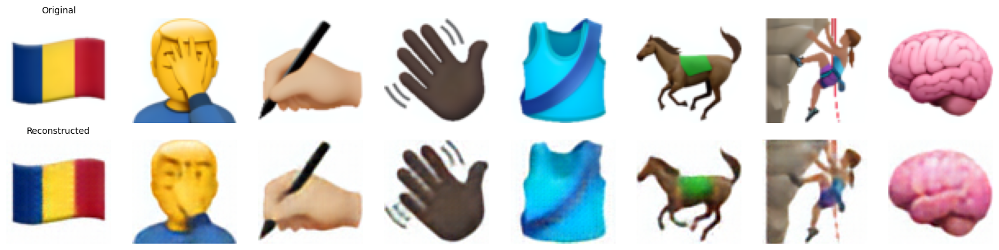

Epoch [81/500] Loss: 0.0118 | Recon: 0.0097 | VQ: 0.0021 | Top: 10/512 | Bottom: 147/512 | LR: 0.000271


Epoch [82/500] Loss: 0.0119 | Recon: 0.0098 | VQ: 0.0021 | Top: 9/512 | Bottom: 149/512 | LR: 0.000270


Epoch [83/500] Loss: 0.0117 | Recon: 0.0096 | VQ: 0.0021 | Top: 10/512 | Bottom: 150/512 | LR: 0.000269


Epoch [84/500] Loss: 0.0116 | Recon: 0.0095 | VQ: 0.0021 | Top: 10/512 | Bottom: 151/512 | LR: 0.000269


Epoch [85/500] Loss: 0.0116 | Recon: 0.0095 | VQ: 0.0021 | Top: 10/512 | Bottom: 153/512 | LR: 0.000268


Epoch [86/500] Loss: 0.0115 | Recon: 0.0094 | VQ: 0.0021 | Top: 10/512 | Bottom: 155/512 | LR: 0.000267


Epoch [87/500] Loss: 0.0114 | Recon: 0.0093 | VQ: 0.0021 | Top: 10/512 | Bottom: 156/512 | LR: 0.000266


Epoch [88/500] Loss: 0.0113 | Recon: 0.0093 | VQ: 0.0020 | Top: 10/512 | Bottom: 158/512 | LR: 0.000266


Epoch [89/500] Loss: 0.0112 | Recon: 0.0092 | VQ: 0.0020 | Top: 10/512 | Bottom: 159/512 | LR: 0.000265


Epoch [90/500] Loss: 0.0112 | Recon: 0.0092 | VQ: 0.0020 | Top: 10/512 | Bottom: 162/512 | LR: 0.000264


Epoch [91/500] Loss: 0.0111 | Recon: 0.0091 | VQ: 0.0020 | Top: 10/512 | Bottom: 166/512 | LR: 0.000263


Epoch [92/500] Loss: 0.0110 | Recon: 0.0090 | VQ: 0.0020 | Top: 10/512 | Bottom: 167/512 | LR: 0.000263


Epoch [93/500] Loss: 0.0110 | Recon: 0.0090 | VQ: 0.0020 | Top: 11/512 | Bottom: 169/512 | LR: 0.000262


Epoch [94/500] Loss: 0.0108 | Recon: 0.0089 | VQ: 0.0020 | Top: 12/512 | Bottom: 170/512 | LR: 0.000261


Epoch [95/500] Loss: 0.0108 | Recon: 0.0089 | VQ: 0.0020 | Top: 12/512 | Bottom: 173/512 | LR: 0.000260


Epoch [96/500] Loss: 0.0107 | Recon: 0.0088 | VQ: 0.0019 | Top: 12/512 | Bottom: 176/512 | LR: 0.000259


Epoch [97/500] Loss: 0.0108 | Recon: 0.0089 | VQ: 0.0019 | Top: 12/512 | Bottom: 179/512 | LR: 0.000259


Epoch [98/500] Loss: 0.0108 | Recon: 0.0089 | VQ: 0.0019 | Top: 13/512 | Bottom: 182/512 | LR: 0.000258


Epoch [99/500] Loss: 0.0104 | Recon: 0.0085 | VQ: 0.0019 | Top: 13/512 | Bottom: 185/512 | LR: 0.000257


Epoch [100/500] Loss: 0.0104 | Recon: 0.0085 | VQ: 0.0019 | Top: 13/512 | Bottom: 185/512 | LR: 0.000256


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmph1ipyxkx" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmpo43nts3x" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 98.59459115785074



Validation Metrics (Epoch 100):
  Loss: 0.0109 | Recon: 0.0090 | VQ: 0.0019
  MSE: 0.008954 | PSNR: 30.0223 dB | SSIM: 0.9001 | FID: 98.5946

 New best FID: 98.59 - Model saved!


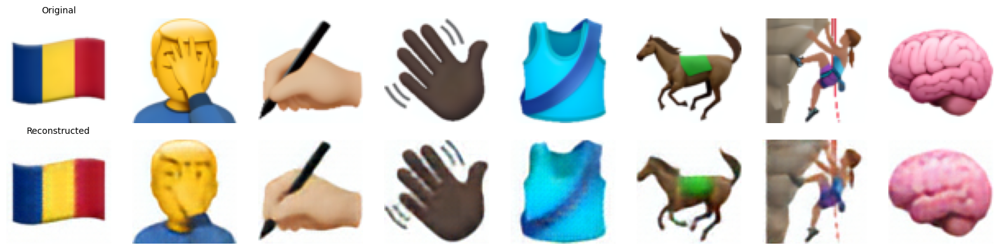

Checkpoint saved at epoch 100


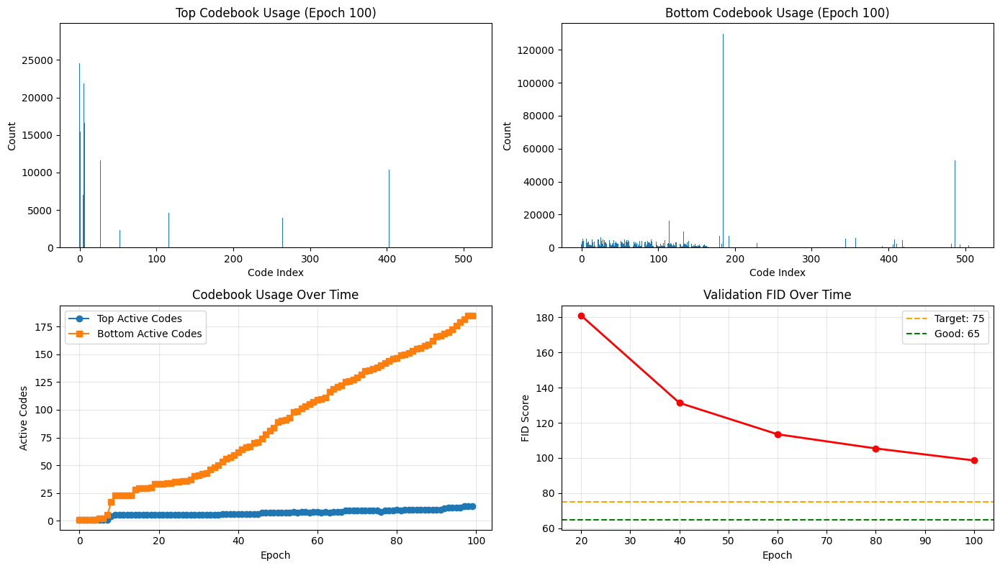

Epoch [101/500] Loss: 0.0103 | Recon: 0.0085 | VQ: 0.0019 | Top: 14/512 | Bottom: 188/512 | LR: 0.000255


Epoch [102/500] Loss: 0.0103 | Recon: 0.0084 | VQ: 0.0019 | Top: 14/512 | Bottom: 190/512 | LR: 0.000255


Epoch [103/500] Loss: 0.0102 | Recon: 0.0084 | VQ: 0.0018 | Top: 14/512 | Bottom: 193/512 | LR: 0.000254


Epoch [104/500] Loss: 0.0102 | Recon: 0.0083 | VQ: 0.0018 | Top: 14/512 | Bottom: 196/512 | LR: 0.000253


Epoch [105/500] Loss: 0.0101 | Recon: 0.0082 | VQ: 0.0018 | Top: 14/512 | Bottom: 199/512 | LR: 0.000252


Epoch [106/500] Loss: 0.0105 | Recon: 0.0087 | VQ: 0.0018 | Top: 14/512 | Bottom: 202/512 | LR: 0.000251


Epoch [107/500] Loss: 0.0100 | Recon: 0.0082 | VQ: 0.0018 | Top: 15/512 | Bottom: 204/512 | LR: 0.000250


Epoch [108/500] Loss: 0.0099 | Recon: 0.0081 | VQ: 0.0018 | Top: 16/512 | Bottom: 207/512 | LR: 0.000249


Epoch [109/500] Loss: 0.0099 | Recon: 0.0081 | VQ: 0.0018 | Top: 16/512 | Bottom: 208/512 | LR: 0.000248


Epoch [110/500] Loss: 0.0098 | Recon: 0.0080 | VQ: 0.0018 | Top: 16/512 | Bottom: 211/512 | LR: 0.000248


Epoch [111/500] Loss: 0.0096 | Recon: 0.0079 | VQ: 0.0017 | Top: 16/512 | Bottom: 213/512 | LR: 0.000247


Epoch [112/500] Loss: 0.0099 | Recon: 0.0081 | VQ: 0.0017 | Top: 17/512 | Bottom: 217/512 | LR: 0.000246


Epoch [113/500] Loss: 0.0095 | Recon: 0.0078 | VQ: 0.0017 | Top: 17/512 | Bottom: 222/512 | LR: 0.000245


Epoch [114/500] Loss: 0.0094 | Recon: 0.0078 | VQ: 0.0017 | Top: 17/512 | Bottom: 225/512 | LR: 0.000244


Epoch [115/500] Loss: 0.0094 | Recon: 0.0077 | VQ: 0.0017 | Top: 18/512 | Bottom: 227/512 | LR: 0.000243


Epoch [116/500] Loss: 0.0095 | Recon: 0.0078 | VQ: 0.0017 | Top: 18/512 | Bottom: 229/512 | LR: 0.000242


Epoch [117/500] Loss: 0.0093 | Recon: 0.0076 | VQ: 0.0017 | Top: 18/512 | Bottom: 232/512 | LR: 0.000241


Epoch [118/500] Loss: 0.0094 | Recon: 0.0077 | VQ: 0.0016 | Top: 19/512 | Bottom: 234/512 | LR: 0.000240


Epoch [119/500] Loss: 0.0093 | Recon: 0.0076 | VQ: 0.0016 | Top: 19/512 | Bottom: 236/512 | LR: 0.000239


Epoch [120/500] Loss: 0.0091 | Recon: 0.0075 | VQ: 0.0016 | Top: 19/512 | Bottom: 240/512 | LR: 0.000238


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmp4disxl6k" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmp8sa7jkzn" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 90.15930303290656



Validation Metrics (Epoch 120):
  Loss: 0.0097 | Recon: 0.0081 | VQ: 0.0017
  MSE: 0.008075 | PSNR: 30.4708 dB | SSIM: 0.9102 | FID: 90.1593

 New best FID: 90.16 - Model saved!


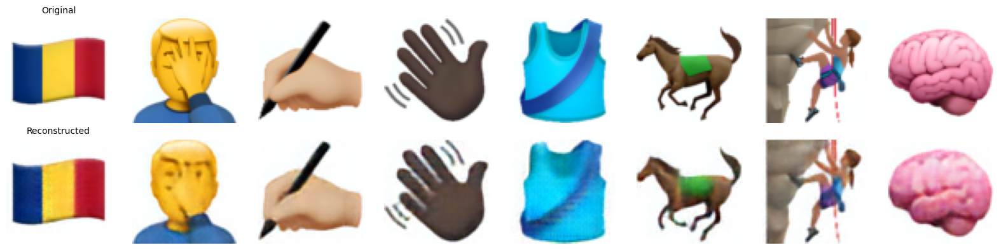

Epoch [121/500] Loss: 0.0091 | Recon: 0.0075 | VQ: 0.0016 | Top: 19/512 | Bottom: 242/512 | LR: 0.000237


Epoch [122/500] Loss: 0.0091 | Recon: 0.0075 | VQ: 0.0016 | Top: 20/512 | Bottom: 244/512 | LR: 0.000236


Epoch [123/500] Loss: 0.0090 | Recon: 0.0074 | VQ: 0.0016 | Top: 20/512 | Bottom: 249/512 | LR: 0.000235


Epoch [124/500] Loss: 0.0090 | Recon: 0.0074 | VQ: 0.0016 | Top: 20/512 | Bottom: 251/512 | LR: 0.000235


Epoch [125/500] Loss: 0.0090 | Recon: 0.0074 | VQ: 0.0016 | Top: 21/512 | Bottom: 251/512 | LR: 0.000234


Epoch [126/500] Loss: 0.0090 | Recon: 0.0075 | VQ: 0.0016 | Top: 21/512 | Bottom: 255/512 | LR: 0.000233


Epoch [127/500] Loss: 0.0089 | Recon: 0.0073 | VQ: 0.0015 | Top: 21/512 | Bottom: 258/512 | LR: 0.000232


Epoch [128/500] Loss: 0.0088 | Recon: 0.0073 | VQ: 0.0015 | Top: 21/512 | Bottom: 262/512 | LR: 0.000231


Epoch [129/500] Loss: 0.0089 | Recon: 0.0073 | VQ: 0.0015 | Top: 21/512 | Bottom: 267/512 | LR: 0.000230


Epoch [130/500] Loss: 0.0087 | Recon: 0.0071 | VQ: 0.0015 | Top: 21/512 | Bottom: 269/512 | LR: 0.000229


Epoch [131/500] Loss: 0.0086 | Recon: 0.0071 | VQ: 0.0015 | Top: 22/512 | Bottom: 271/512 | LR: 0.000228


Epoch [132/500] Loss: 0.0086 | Recon: 0.0071 | VQ: 0.0015 | Top: 22/512 | Bottom: 272/512 | LR: 0.000227


Epoch [133/500] Loss: 0.0087 | Recon: 0.0072 | VQ: 0.0015 | Top: 22/512 | Bottom: 275/512 | LR: 0.000226


Epoch [134/500] Loss: 0.0087 | Recon: 0.0072 | VQ: 0.0015 | Top: 22/512 | Bottom: 280/512 | LR: 0.000225


Epoch [135/500] Loss: 0.0086 | Recon: 0.0071 | VQ: 0.0015 | Top: 22/512 | Bottom: 283/512 | LR: 0.000224


Epoch [136/500] Loss: 0.0084 | Recon: 0.0069 | VQ: 0.0015 | Top: 22/512 | Bottom: 287/512 | LR: 0.000223


Epoch [137/500] Loss: 0.0084 | Recon: 0.0070 | VQ: 0.0015 | Top: 22/512 | Bottom: 290/512 | LR: 0.000221


Epoch [138/500] Loss: 0.0084 | Recon: 0.0070 | VQ: 0.0014 | Top: 22/512 | Bottom: 293/512 | LR: 0.000220


Epoch [139/500] Loss: 0.0083 | Recon: 0.0069 | VQ: 0.0014 | Top: 22/512 | Bottom: 294/512 | LR: 0.000219


Epoch [140/500] Loss: 0.0083 | Recon: 0.0068 | VQ: 0.0015 | Top: 22/512 | Bottom: 296/512 | LR: 0.000218


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmp854677le" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmps22jdzof" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 85.47118115354294



Validation Metrics (Epoch 140):
  Loss: 0.0089 | Recon: 0.0075 | VQ: 0.0015
  MSE: 0.007455 | PSNR: 30.8177 dB | SSIM: 0.9132 | FID: 85.4712

 New best FID: 85.47 - Model saved!


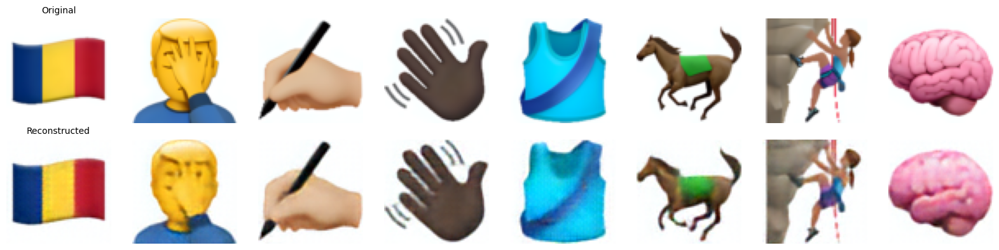

Epoch [141/500] Loss: 0.0083 | Recon: 0.0069 | VQ: 0.0014 | Top: 23/512 | Bottom: 297/512 | LR: 0.000217


Epoch [142/500] Loss: 0.0084 | Recon: 0.0070 | VQ: 0.0014 | Top: 23/512 | Bottom: 299/512 | LR: 0.000216


Epoch [143/500] Loss: 0.0082 | Recon: 0.0068 | VQ: 0.0014 | Top: 23/512 | Bottom: 301/512 | LR: 0.000215


Epoch [144/500] Loss: 0.0082 | Recon: 0.0068 | VQ: 0.0014 | Top: 23/512 | Bottom: 303/512 | LR: 0.000214


Epoch [145/500] Loss: 0.0081 | Recon: 0.0067 | VQ: 0.0014 | Top: 23/512 | Bottom: 307/512 | LR: 0.000213


Epoch [146/500] Loss: 0.0080 | Recon: 0.0066 | VQ: 0.0014 | Top: 23/512 | Bottom: 308/512 | LR: 0.000212


Epoch [147/500] Loss: 0.0081 | Recon: 0.0067 | VQ: 0.0014 | Top: 23/512 | Bottom: 311/512 | LR: 0.000211


Epoch [148/500] Loss: 0.0080 | Recon: 0.0066 | VQ: 0.0014 | Top: 23/512 | Bottom: 315/512 | LR: 0.000210


Epoch [149/500] Loss: 0.0080 | Recon: 0.0066 | VQ: 0.0014 | Top: 23/512 | Bottom: 318/512 | LR: 0.000209


Epoch [150/500] Loss: 0.0079 | Recon: 0.0065 | VQ: 0.0014 | Top: 25/512 | Bottom: 321/512 | LR: 0.000208
Checkpoint saved at epoch 150


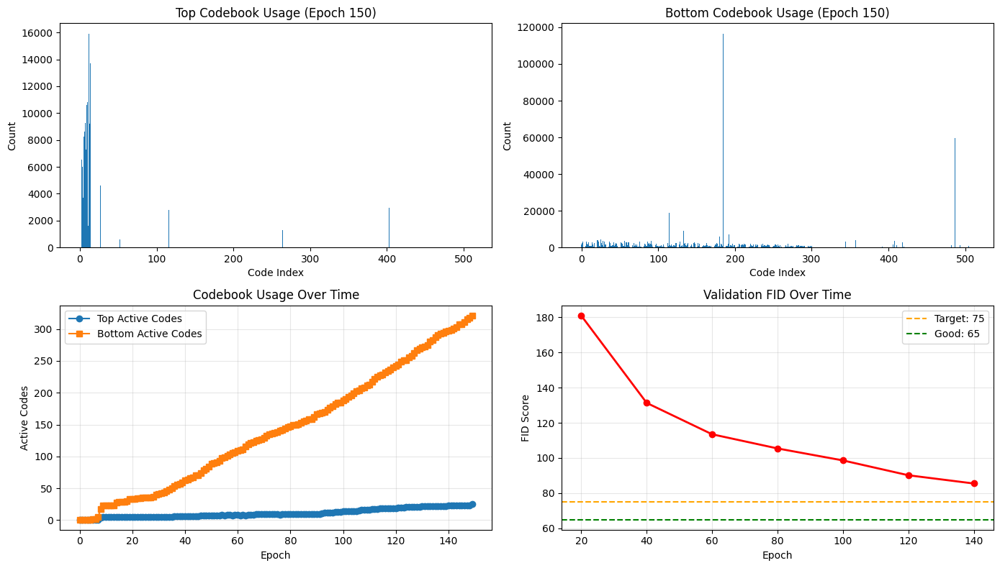

Epoch [151/500] Loss: 0.0079 | Recon: 0.0065 | VQ: 0.0014 | Top: 25/512 | Bottom: 324/512 | LR: 0.000207


Epoch [152/500] Loss: 0.0079 | Recon: 0.0066 | VQ: 0.0014 | Top: 25/512 | Bottom: 326/512 | LR: 0.000206


Epoch [153/500] Loss: 0.0078 | Recon: 0.0065 | VQ: 0.0014 | Top: 25/512 | Bottom: 328/512 | LR: 0.000204


Epoch [154/500] Loss: 0.0081 | Recon: 0.0067 | VQ: 0.0014 | Top: 25/512 | Bottom: 331/512 | LR: 0.000203


Epoch [155/500] Loss: 0.0078 | Recon: 0.0064 | VQ: 0.0013 | Top: 25/512 | Bottom: 332/512 | LR: 0.000202


Epoch [156/500] Loss: 0.0077 | Recon: 0.0064 | VQ: 0.0013 | Top: 25/512 | Bottom: 336/512 | LR: 0.000201


Epoch [157/500] Loss: 0.0077 | Recon: 0.0064 | VQ: 0.0013 | Top: 25/512 | Bottom: 339/512 | LR: 0.000200


Epoch [158/500] Loss: 0.0076 | Recon: 0.0063 | VQ: 0.0013 | Top: 25/512 | Bottom: 339/512 | LR: 0.000199


Epoch [159/500] Loss: 0.0076 | Recon: 0.0063 | VQ: 0.0013 | Top: 24/512 | Bottom: 340/512 | LR: 0.000198


Epoch [160/500] Loss: 0.0076 | Recon: 0.0062 | VQ: 0.0013 | Top: 25/512 | Bottom: 343/512 | LR: 0.000197


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmp857oytnq" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmp4n7pnrt6" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 83.20220083122541



Validation Metrics (Epoch 160):
  Loss: 0.0083 | Recon: 0.0070 | VQ: 0.0013
  MSE: 0.006955 | PSNR: 31.1192 dB | SSIM: 0.9183 | FID: 83.2022

 New best FID: 83.20 - Model saved!


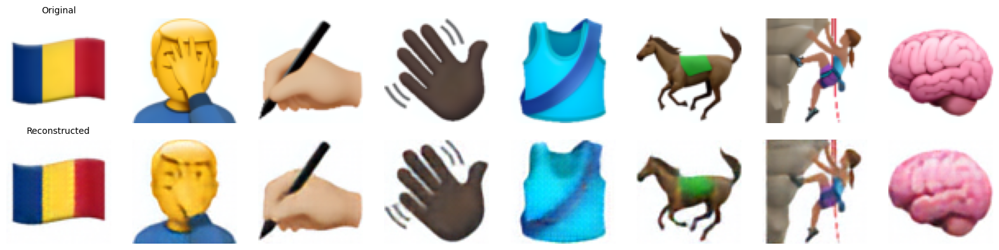

Epoch [161/500] Loss: 0.0076 | Recon: 0.0063 | VQ: 0.0013 | Top: 26/512 | Bottom: 343/512 | LR: 0.000196


Epoch [162/500] Loss: 0.0076 | Recon: 0.0063 | VQ: 0.0013 | Top: 26/512 | Bottom: 345/512 | LR: 0.000194


Epoch [163/500] Loss: 0.0075 | Recon: 0.0062 | VQ: 0.0013 | Top: 26/512 | Bottom: 349/512 | LR: 0.000193


Epoch [164/500] Loss: 0.0075 | Recon: 0.0062 | VQ: 0.0013 | Top: 26/512 | Bottom: 352/512 | LR: 0.000192


Epoch [165/500] Loss: 0.0075 | Recon: 0.0062 | VQ: 0.0013 | Top: 26/512 | Bottom: 354/512 | LR: 0.000191


Epoch [166/500] Loss: 0.0074 | Recon: 0.0061 | VQ: 0.0013 | Top: 25/512 | Bottom: 357/512 | LR: 0.000190


Epoch [167/500] Loss: 0.0074 | Recon: 0.0061 | VQ: 0.0013 | Top: 27/512 | Bottom: 359/512 | LR: 0.000189


Epoch [168/500] Loss: 0.0074 | Recon: 0.0061 | VQ: 0.0013 | Top: 27/512 | Bottom: 361/512 | LR: 0.000188


Epoch [169/500] Loss: 0.0074 | Recon: 0.0062 | VQ: 0.0013 | Top: 27/512 | Bottom: 363/512 | LR: 0.000187


Epoch [170/500] Loss: 0.0074 | Recon: 0.0061 | VQ: 0.0013 | Top: 27/512 | Bottom: 364/512 | LR: 0.000185


Epoch [171/500] Loss: 0.0074 | Recon: 0.0061 | VQ: 0.0013 | Top: 27/512 | Bottom: 371/512 | LR: 0.000184


Epoch [172/500] Loss: 0.0073 | Recon: 0.0061 | VQ: 0.0013 | Top: 27/512 | Bottom: 375/512 | LR: 0.000183


Epoch [173/500] Loss: 0.0072 | Recon: 0.0060 | VQ: 0.0013 | Top: 27/512 | Bottom: 375/512 | LR: 0.000182


Epoch [174/500] Loss: 0.0073 | Recon: 0.0060 | VQ: 0.0013 | Top: 27/512 | Bottom: 377/512 | LR: 0.000181


Epoch [175/500] Loss: 0.0072 | Recon: 0.0059 | VQ: 0.0013 | Top: 27/512 | Bottom: 378/512 | LR: 0.000180


Epoch [176/500] Loss: 0.0072 | Recon: 0.0059 | VQ: 0.0013 | Top: 27/512 | Bottom: 381/512 | LR: 0.000179


Epoch [177/500] Loss: 0.0072 | Recon: 0.0059 | VQ: 0.0012 | Top: 27/512 | Bottom: 383/512 | LR: 0.000177


Epoch [178/500] Loss: 0.0072 | Recon: 0.0059 | VQ: 0.0012 | Top: 27/512 | Bottom: 385/512 | LR: 0.000176


Epoch [179/500] Loss: 0.0072 | Recon: 0.0059 | VQ: 0.0012 | Top: 27/512 | Bottom: 387/512 | LR: 0.000175


Epoch [180/500] Loss: 0.0071 | Recon: 0.0059 | VQ: 0.0012 | Top: 27/512 | Bottom: 390/512 | LR: 0.000174


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmp7gd_v2wj" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmp9jvrqbjt" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 81.30344796909347



Validation Metrics (Epoch 180):
  Loss: 0.0080 | Recon: 0.0067 | VQ: 0.0013
  MSE: 0.006694 | PSNR: 31.2853 dB | SSIM: 0.9221 | FID: 81.3034

 New best FID: 81.30 - Model saved!


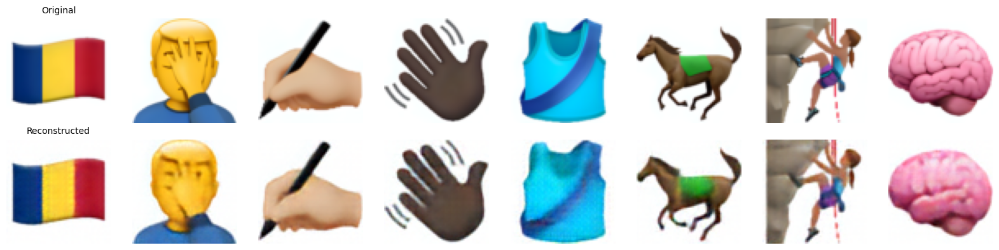

Epoch [181/500] Loss: 0.0071 | Recon: 0.0059 | VQ: 0.0012 | Top: 27/512 | Bottom: 393/512 | LR: 0.000173


Epoch [182/500] Loss: 0.0071 | Recon: 0.0059 | VQ: 0.0012 | Top: 27/512 | Bottom: 395/512 | LR: 0.000172


Epoch [183/500] Loss: 0.0070 | Recon: 0.0058 | VQ: 0.0012 | Top: 27/512 | Bottom: 397/512 | LR: 0.000170


Epoch [184/500] Loss: 0.0071 | Recon: 0.0059 | VQ: 0.0012 | Top: 27/512 | Bottom: 399/512 | LR: 0.000169


Epoch [185/500] Loss: 0.0070 | Recon: 0.0057 | VQ: 0.0012 | Top: 27/512 | Bottom: 404/512 | LR: 0.000168


Epoch [186/500] Loss: 0.0070 | Recon: 0.0057 | VQ: 0.0012 | Top: 27/512 | Bottom: 405/512 | LR: 0.000167


Epoch [187/500] Loss: 0.0069 | Recon: 0.0057 | VQ: 0.0012 | Top: 27/512 | Bottom: 406/512 | LR: 0.000166


Epoch [188/500] Loss: 0.0069 | Recon: 0.0057 | VQ: 0.0012 | Top: 27/512 | Bottom: 409/512 | LR: 0.000165


Epoch [189/500] Loss: 0.0071 | Recon: 0.0059 | VQ: 0.0012 | Top: 27/512 | Bottom: 410/512 | LR: 0.000163


Epoch [190/500] Loss: 0.0069 | Recon: 0.0057 | VQ: 0.0012 | Top: 27/512 | Bottom: 413/512 | LR: 0.000162


Epoch [191/500] Loss: 0.0069 | Recon: 0.0057 | VQ: 0.0012 | Top: 27/512 | Bottom: 416/512 | LR: 0.000161


Epoch [192/500] Loss: 0.0069 | Recon: 0.0057 | VQ: 0.0012 | Top: 26/512 | Bottom: 418/512 | LR: 0.000160


Epoch [193/500] Loss: 0.0069 | Recon: 0.0057 | VQ: 0.0012 | Top: 27/512 | Bottom: 419/512 | LR: 0.000159


Epoch [194/500] Loss: 0.0068 | Recon: 0.0057 | VQ: 0.0012 | Top: 27/512 | Bottom: 420/512 | LR: 0.000158


Epoch [195/500] Loss: 0.0067 | Recon: 0.0056 | VQ: 0.0012 | Top: 27/512 | Bottom: 421/512 | LR: 0.000156


Epoch [196/500] Loss: 0.0068 | Recon: 0.0056 | VQ: 0.0012 | Top: 27/512 | Bottom: 422/512 | LR: 0.000155


Epoch [197/500] Loss: 0.0068 | Recon: 0.0056 | VQ: 0.0012 | Top: 27/512 | Bottom: 424/512 | LR: 0.000154


Epoch [198/500] Loss: 0.0067 | Recon: 0.0055 | VQ: 0.0012 | Top: 27/512 | Bottom: 425/512 | LR: 0.000153


Epoch [199/500] Loss: 0.0067 | Recon: 0.0056 | VQ: 0.0012 | Top: 28/512 | Bottom: 427/512 | LR: 0.000152


Epoch [200/500] Loss: 0.0067 | Recon: 0.0056 | VQ: 0.0012 | Top: 28/512 | Bottom: 430/512 | LR: 0.000150


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmpz9v8ntcj" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmppljee28f" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 80.97111377963773



Validation Metrics (Epoch 200):
  Loss: 0.0076 | Recon: 0.0064 | VQ: 0.0012
  MSE: 0.006408 | PSNR: 31.4751 dB | SSIM: 0.9250 | FID: 80.9711

 New best FID: 80.97 - Model saved!


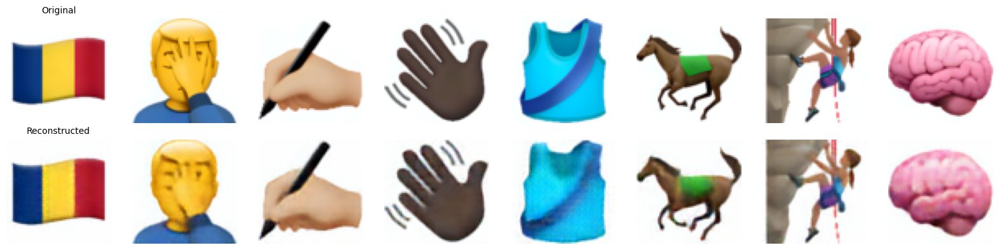

Checkpoint saved at epoch 200


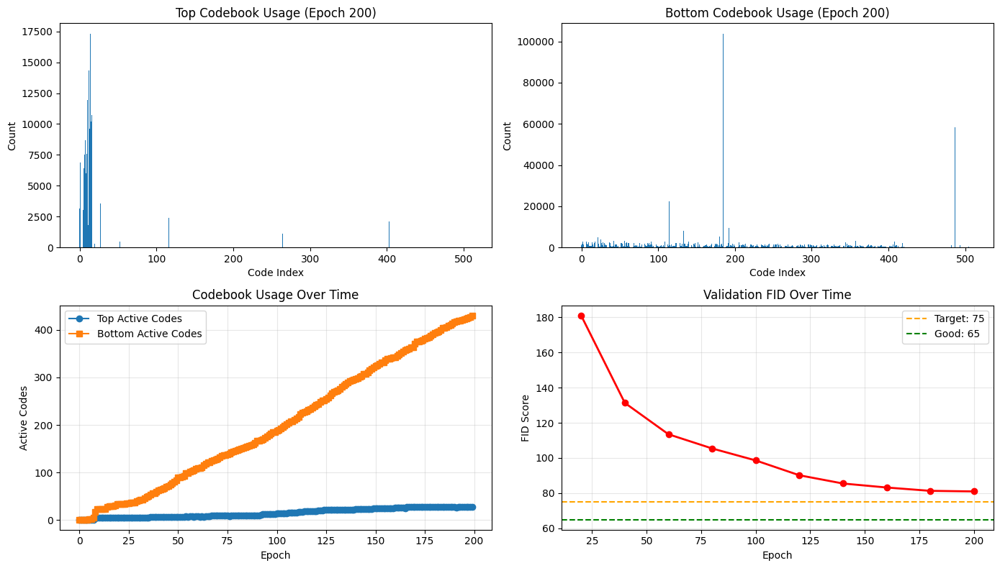

Epoch [201/500] Loss: 0.0067 | Recon: 0.0055 | VQ: 0.0012 | Top: 28/512 | Bottom: 430/512 | LR: 0.000149


Epoch [202/500] Loss: 0.0067 | Recon: 0.0055 | VQ: 0.0012 | Top: 28/512 | Bottom: 433/512 | LR: 0.000148


Epoch [203/500] Loss: 0.0066 | Recon: 0.0055 | VQ: 0.0012 | Top: 28/512 | Bottom: 435/512 | LR: 0.000147


Epoch [204/500] Loss: 0.0067 | Recon: 0.0055 | VQ: 0.0012 | Top: 28/512 | Bottom: 436/512 | LR: 0.000146


Epoch [205/500] Loss: 0.0067 | Recon: 0.0055 | VQ: 0.0012 | Top: 28/512 | Bottom: 437/512 | LR: 0.000145


Epoch [206/500] Loss: 0.0066 | Recon: 0.0054 | VQ: 0.0012 | Top: 28/512 | Bottom: 437/512 | LR: 0.000143


Epoch [207/500] Loss: 0.0066 | Recon: 0.0054 | VQ: 0.0012 | Top: 28/512 | Bottom: 438/512 | LR: 0.000142


Epoch [208/500] Loss: 0.0066 | Recon: 0.0054 | VQ: 0.0012 | Top: 28/512 | Bottom: 438/512 | LR: 0.000141


Epoch [209/500] Loss: 0.0065 | Recon: 0.0054 | VQ: 0.0012 | Top: 28/512 | Bottom: 440/512 | LR: 0.000140


Epoch [210/500] Loss: 0.0065 | Recon: 0.0054 | VQ: 0.0012 | Top: 28/512 | Bottom: 441/512 | LR: 0.000139


Epoch [211/500] Loss: 0.0065 | Recon: 0.0054 | VQ: 0.0012 | Top: 28/512 | Bottom: 441/512 | LR: 0.000138


Epoch [212/500] Loss: 0.0066 | Recon: 0.0055 | VQ: 0.0012 | Top: 28/512 | Bottom: 442/512 | LR: 0.000136


Epoch [213/500] Loss: 0.0065 | Recon: 0.0053 | VQ: 0.0012 | Top: 28/512 | Bottom: 444/512 | LR: 0.000135


Epoch [214/500] Loss: 0.0064 | Recon: 0.0053 | VQ: 0.0011 | Top: 28/512 | Bottom: 445/512 | LR: 0.000134


Epoch [215/500] Loss: 0.0064 | Recon: 0.0053 | VQ: 0.0011 | Top: 28/512 | Bottom: 446/512 | LR: 0.000133


Epoch [216/500] Loss: 0.0064 | Recon: 0.0053 | VQ: 0.0011 | Top: 28/512 | Bottom: 447/512 | LR: 0.000132


Epoch [217/500] Loss: 0.0065 | Recon: 0.0053 | VQ: 0.0011 | Top: 28/512 | Bottom: 449/512 | LR: 0.000131


Epoch [218/500] Loss: 0.0064 | Recon: 0.0053 | VQ: 0.0011 | Top: 28/512 | Bottom: 450/512 | LR: 0.000129


Epoch [219/500] Loss: 0.0064 | Recon: 0.0053 | VQ: 0.0011 | Top: 28/512 | Bottom: 451/512 | LR: 0.000128


Epoch [220/500] Loss: 0.0064 | Recon: 0.0052 | VQ: 0.0011 | Top: 28/512 | Bottom: 452/512 | LR: 0.000127


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmp0ezk1m3o" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmpb85ql73v" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 78.03463837442072



Validation Metrics (Epoch 220):
  Loss: 0.0074 | Recon: 0.0062 | VQ: 0.0012
  MSE: 0.006228 | PSNR: 31.5988 dB | SSIM: 0.9275 | FID: 78.0346

 New best FID: 78.03 - Model saved!


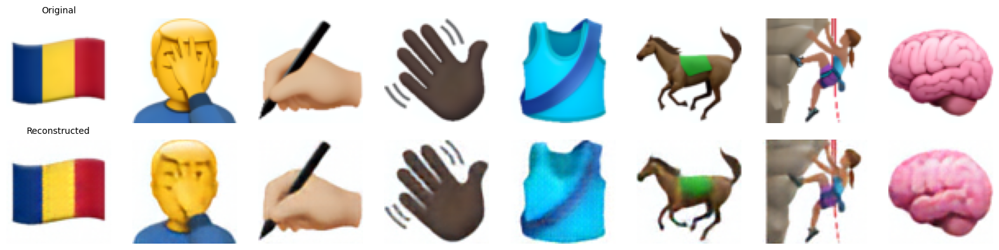

Epoch [221/500] Loss: 0.0064 | Recon: 0.0052 | VQ: 0.0011 | Top: 28/512 | Bottom: 454/512 | LR: 0.000126


Epoch [222/500] Loss: 0.0064 | Recon: 0.0052 | VQ: 0.0011 | Top: 28/512 | Bottom: 454/512 | LR: 0.000125


Epoch [223/500] Loss: 0.0064 | Recon: 0.0052 | VQ: 0.0011 | Top: 28/512 | Bottom: 455/512 | LR: 0.000124


Epoch [224/500] Loss: 0.0063 | Recon: 0.0052 | VQ: 0.0011 | Top: 28/512 | Bottom: 458/512 | LR: 0.000122


Epoch [225/500] Loss: 0.0063 | Recon: 0.0052 | VQ: 0.0011 | Top: 28/512 | Bottom: 459/512 | LR: 0.000121


Epoch [226/500] Loss: 0.0063 | Recon: 0.0052 | VQ: 0.0011 | Top: 28/512 | Bottom: 459/512 | LR: 0.000120


Epoch [227/500] Loss: 0.0063 | Recon: 0.0052 | VQ: 0.0011 | Top: 28/512 | Bottom: 460/512 | LR: 0.000119


Epoch [228/500] Loss: 0.0064 | Recon: 0.0052 | VQ: 0.0011 | Top: 28/512 | Bottom: 460/512 | LR: 0.000118


Epoch [229/500] Loss: 0.0063 | Recon: 0.0051 | VQ: 0.0011 | Top: 28/512 | Bottom: 462/512 | LR: 0.000117


Epoch [230/500] Loss: 0.0063 | Recon: 0.0051 | VQ: 0.0011 | Top: 28/512 | Bottom: 462/512 | LR: 0.000116


Epoch [231/500] Loss: 0.0062 | Recon: 0.0051 | VQ: 0.0011 | Top: 28/512 | Bottom: 464/512 | LR: 0.000114


Epoch [232/500] Loss: 0.0062 | Recon: 0.0051 | VQ: 0.0011 | Top: 28/512 | Bottom: 465/512 | LR: 0.000113


Epoch [233/500] Loss: 0.0063 | Recon: 0.0051 | VQ: 0.0011 | Top: 28/512 | Bottom: 465/512 | LR: 0.000112


Epoch [234/500] Loss: 0.0062 | Recon: 0.0051 | VQ: 0.0011 | Top: 28/512 | Bottom: 467/512 | LR: 0.000111


Epoch [235/500] Loss: 0.0062 | Recon: 0.0051 | VQ: 0.0011 | Top: 28/512 | Bottom: 469/512 | LR: 0.000110


Epoch [236/500] Loss: 0.0062 | Recon: 0.0051 | VQ: 0.0011 | Top: 28/512 | Bottom: 469/512 | LR: 0.000109


Epoch [237/500] Loss: 0.0062 | Recon: 0.0051 | VQ: 0.0011 | Top: 28/512 | Bottom: 472/512 | LR: 0.000108


Epoch [238/500] Loss: 0.0062 | Recon: 0.0050 | VQ: 0.0011 | Top: 28/512 | Bottom: 474/512 | LR: 0.000107


Epoch [239/500] Loss: 0.0062 | Recon: 0.0051 | VQ: 0.0011 | Top: 28/512 | Bottom: 474/512 | LR: 0.000105


Epoch [240/500] Loss: 0.0061 | Recon: 0.0050 | VQ: 0.0011 | Top: 28/512 | Bottom: 475/512 | LR: 0.000104


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmpkc45qx4_" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmpori9i9zm" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 76.03966814563705



Validation Metrics (Epoch 240):
  Loss: 0.0073 | Recon: 0.0061 | VQ: 0.0012
  MSE: 0.006088 | PSNR: 31.6979 dB | SSIM: 0.9289 | FID: 76.0397

 New best FID: 76.04 - Model saved!


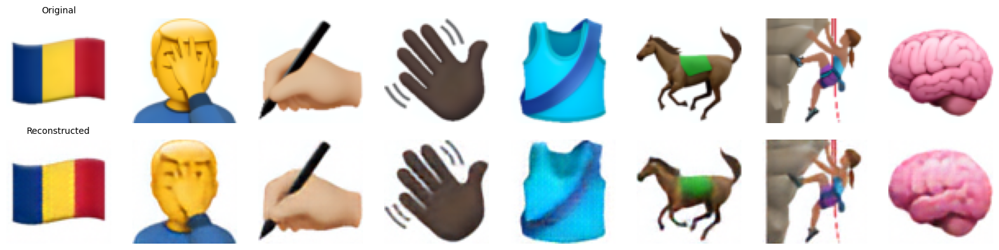

Epoch [241/500] Loss: 0.0062 | Recon: 0.0050 | VQ: 0.0011 | Top: 28/512 | Bottom: 476/512 | LR: 0.000103


Epoch [242/500] Loss: 0.0061 | Recon: 0.0050 | VQ: 0.0011 | Top: 28/512 | Bottom: 477/512 | LR: 0.000102


Epoch [243/500] Loss: 0.0062 | Recon: 0.0050 | VQ: 0.0011 | Top: 28/512 | Bottom: 478/512 | LR: 0.000101


Epoch [244/500] Loss: 0.0061 | Recon: 0.0050 | VQ: 0.0011 | Top: 28/512 | Bottom: 479/512 | LR: 0.000100


Epoch [245/500] Loss: 0.0061 | Recon: 0.0050 | VQ: 0.0011 | Top: 28/512 | Bottom: 481/512 | LR: 0.000099


Epoch [246/500] Loss: 0.0061 | Recon: 0.0050 | VQ: 0.0011 | Top: 28/512 | Bottom: 482/512 | LR: 0.000098


Epoch [247/500] Loss: 0.0060 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 482/512 | LR: 0.000097


Epoch [248/500] Loss: 0.0060 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 483/512 | LR: 0.000095


Epoch [249/500] Loss: 0.0060 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 483/512 | LR: 0.000094


Epoch [250/500] Loss: 0.0060 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 484/512 | LR: 0.000093
Checkpoint saved at epoch 250


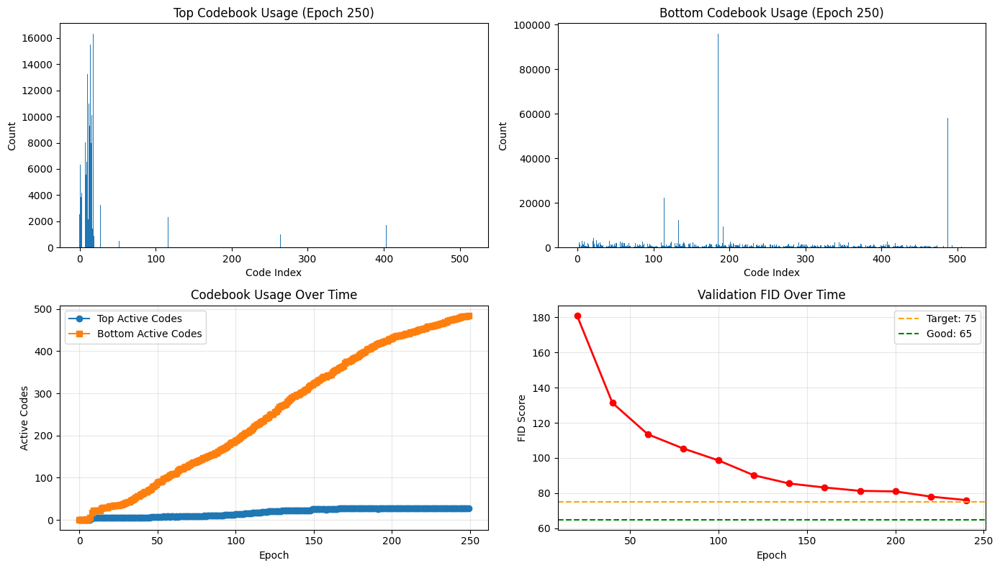

Epoch [251/500] Loss: 0.0061 | Recon: 0.0050 | VQ: 0.0011 | Top: 28/512 | Bottom: 485/512 | LR: 0.000092


Epoch [252/500] Loss: 0.0061 | Recon: 0.0050 | VQ: 0.0011 | Top: 28/512 | Bottom: 486/512 | LR: 0.000091


Epoch [253/500] Loss: 0.0060 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 487/512 | LR: 0.000090


Epoch [254/500] Loss: 0.0061 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 490/512 | LR: 0.000089


Epoch [255/500] Loss: 0.0060 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 492/512 | LR: 0.000088


Epoch [256/500] Loss: 0.0060 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 494/512 | LR: 0.000087


Epoch [257/500] Loss: 0.0060 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 495/512 | LR: 0.000086


Epoch [258/500] Loss: 0.0060 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 495/512 | LR: 0.000085


Epoch [259/500] Loss: 0.0060 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 498/512 | LR: 0.000084


Epoch [260/500] Loss: 0.0060 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 500/512 | LR: 0.000083


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmp9arwoc6e" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmpyj2wk32d" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 75.69615437209745



Validation Metrics (Epoch 260):
  Loss: 0.0070 | Recon: 0.0059 | VQ: 0.0011
  MSE: 0.005913 | PSNR: 31.8241 dB | SSIM: 0.9300 | FID: 75.6962

 New best FID: 75.70 - Model saved!


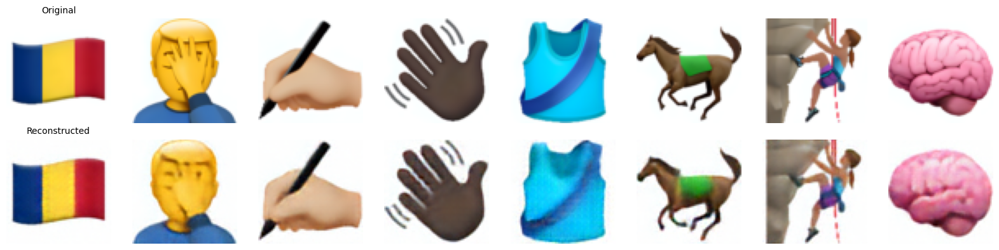

Epoch [261/500] Loss: 0.0060 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 500/512 | LR: 0.000082


Epoch [262/500] Loss: 0.0060 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 501/512 | LR: 0.000081


Epoch [263/500] Loss: 0.0059 | Recon: 0.0048 | VQ: 0.0011 | Top: 28/512 | Bottom: 502/512 | LR: 0.000080


Epoch [264/500] Loss: 0.0059 | Recon: 0.0048 | VQ: 0.0011 | Top: 28/512 | Bottom: 504/512 | LR: 0.000078


Epoch [265/500] Loss: 0.0059 | Recon: 0.0048 | VQ: 0.0011 | Top: 28/512 | Bottom: 504/512 | LR: 0.000077


Epoch [266/500] Loss: 0.0059 | Recon: 0.0048 | VQ: 0.0011 | Top: 28/512 | Bottom: 504/512 | LR: 0.000076


Epoch [267/500] Loss: 0.0059 | Recon: 0.0048 | VQ: 0.0011 | Top: 28/512 | Bottom: 505/512 | LR: 0.000075


Epoch [268/500] Loss: 0.0059 | Recon: 0.0048 | VQ: 0.0011 | Top: 28/512 | Bottom: 506/512 | LR: 0.000074


Epoch [269/500] Loss: 0.0059 | Recon: 0.0048 | VQ: 0.0011 | Top: 28/512 | Bottom: 509/512 | LR: 0.000073


Epoch [270/500] Loss: 0.0059 | Recon: 0.0049 | VQ: 0.0011 | Top: 28/512 | Bottom: 509/512 | LR: 0.000072


Epoch [271/500] Loss: 0.0059 | Recon: 0.0048 | VQ: 0.0011 | Top: 28/512 | Bottom: 510/512 | LR: 0.000071


Epoch [272/500] Loss: 0.0058 | Recon: 0.0048 | VQ: 0.0011 | Top: 28/512 | Bottom: 511/512 | LR: 0.000070


Epoch [273/500] Loss: 0.0058 | Recon: 0.0048 | VQ: 0.0011 | Top: 28/512 | Bottom: 511/512 | LR: 0.000069


Epoch [274/500] Loss: 0.0058 | Recon: 0.0048 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000068


Epoch [275/500] Loss: 0.0058 | Recon: 0.0048 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000067


Epoch [276/500] Loss: 0.0059 | Recon: 0.0048 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000066


Epoch [277/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000066


Epoch [278/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000065


Epoch [279/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000064


Epoch [280/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000063


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmpejo6j0__" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmp6rmeew48" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 75.01544218200587



Validation Metrics (Epoch 280):
  Loss: 0.0070 | Recon: 0.0059 | VQ: 0.0011
  MSE: 0.005867 | PSNR: 31.8582 dB | SSIM: 0.9315 | FID: 75.0154

 New best FID: 75.02 - Model saved!


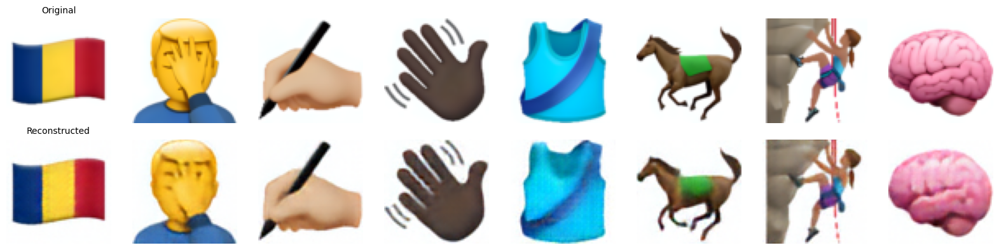

Epoch [281/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000062


Epoch [282/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000061


Epoch [283/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000060


Epoch [284/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000059


Epoch [285/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000058


Epoch [286/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000057


Epoch [287/500] Loss: 0.0057 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000056


Epoch [288/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000055


Epoch [289/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000054


Epoch [290/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000053


Epoch [291/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000053


Epoch [292/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000052


Epoch [293/500] Loss: 0.0057 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000051


Epoch [294/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000050


Epoch [295/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000049


Epoch [296/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000048


Epoch [297/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000047


Epoch [298/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000046


Epoch [299/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000046


Epoch [300/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000045


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmp3se8wg4w" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmpkn7wjn48" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 74.66032337482878



Validation Metrics (Epoch 300):
  Loss: 0.0069 | Recon: 0.0058 | VQ: 0.0011
  MSE: 0.005809 | PSNR: 31.9012 dB | SSIM: 0.9343 | FID: 74.6603

 New best FID: 74.66 - Model saved!


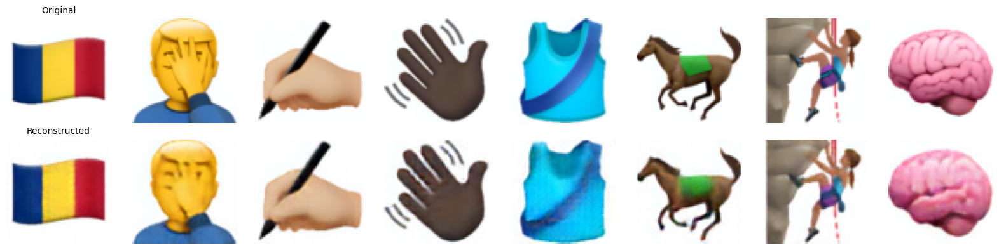

Checkpoint saved at epoch 300


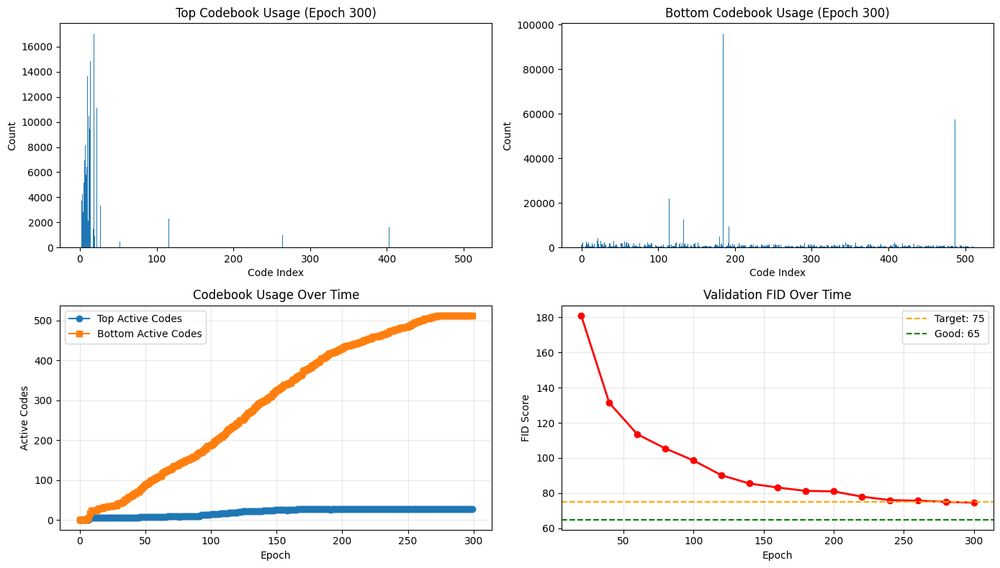


FID hasn't improved in 100 epochs and reached 74.66


Epoch [301/500] Loss: 0.0058 | Recon: 0.0047 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000044

FID hasn't improved in 100 epochs and reached 74.66


Epoch [302/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000043

FID hasn't improved in 100 epochs and reached 74.66


Epoch [303/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000042

FID hasn't improved in 100 epochs and reached 74.66


Epoch [304/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000042

FID hasn't improved in 100 epochs and reached 74.66


Epoch [305/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000041

FID hasn't improved in 100 epochs and reached 74.66


Epoch [306/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000040

FID hasn't improved in 100 epochs and reached 74.66


Epoch [307/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000039

FID hasn't improved in 100 epochs and reached 74.66


Epoch [308/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000038

FID hasn't improved in 100 epochs and reached 74.66


Epoch [309/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000038

FID hasn't improved in 100 epochs and reached 74.66


Epoch [310/500] Loss: 0.0056 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000037

FID hasn't improved in 100 epochs and reached 74.66


Epoch [311/500] Loss: 0.0056 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000036

FID hasn't improved in 100 epochs and reached 74.66


Epoch [312/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000035

FID hasn't improved in 100 epochs and reached 74.66


Epoch [313/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000035

FID hasn't improved in 100 epochs and reached 74.66


Epoch [314/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000034

FID hasn't improved in 100 epochs and reached 74.66


Epoch [315/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000033

FID hasn't improved in 100 epochs and reached 74.66


Epoch [316/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000032

FID hasn't improved in 100 epochs and reached 74.66


Epoch [317/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000032

FID hasn't improved in 100 epochs and reached 74.66


Epoch [318/500] Loss: 0.0056 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000031

FID hasn't improved in 100 epochs and reached 74.66


Epoch [319/500] Loss: 0.0056 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000030

FID hasn't improved in 100 epochs and reached 74.66


Epoch [320/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000030


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmp_x_m3zyn" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmpogjx77dk" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 75.11056025038147



Validation Metrics (Epoch 320):
  Loss: 0.0069 | Recon: 0.0058 | VQ: 0.0011
  MSE: 0.005760 | PSNR: 31.9386 dB | SSIM: 0.9342 | FID: 75.1106



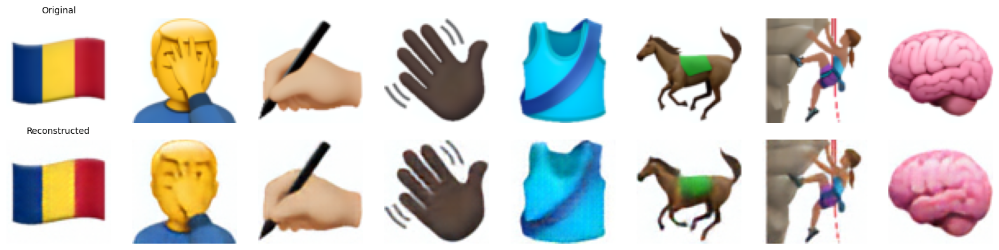


FID hasn't improved in 100 epochs and reached 74.66


Epoch [321/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000029

FID hasn't improved in 100 epochs and reached 74.66


Epoch [322/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000028

FID hasn't improved in 100 epochs and reached 74.66


Epoch [323/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000028

FID hasn't improved in 100 epochs and reached 74.66


Epoch [324/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000027

FID hasn't improved in 100 epochs and reached 74.66


Epoch [325/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000026

FID hasn't improved in 100 epochs and reached 74.66


Epoch [326/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000026

FID hasn't improved in 100 epochs and reached 74.66


Epoch [327/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000025

FID hasn't improved in 100 epochs and reached 74.66


Epoch [328/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000024

FID hasn't improved in 100 epochs and reached 74.66


Epoch [329/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000024

FID hasn't improved in 100 epochs and reached 74.66


Epoch [330/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000023

FID hasn't improved in 100 epochs and reached 74.66


Epoch [331/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000022

FID hasn't improved in 100 epochs and reached 74.66


Epoch [332/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 28/512 | Bottom: 512/512 | LR: 0.000022

FID hasn't improved in 100 epochs and reached 74.66


Epoch [333/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000021

FID hasn't improved in 100 epochs and reached 74.66


Epoch [334/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000021

FID hasn't improved in 100 epochs and reached 74.66


Epoch [335/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000020

FID hasn't improved in 100 epochs and reached 74.66


Epoch [336/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000019

FID hasn't improved in 100 epochs and reached 74.66


Epoch [337/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000019

FID hasn't improved in 100 epochs and reached 74.66


Epoch [338/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000018

FID hasn't improved in 100 epochs and reached 74.66


Epoch [339/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000018

FID hasn't improved in 100 epochs and reached 74.66


Epoch [340/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000017


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmpwednywce" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmprpp93eyv" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 74.27072775729346



Validation Metrics (Epoch 340):
  Loss: 0.0069 | Recon: 0.0058 | VQ: 0.0011
  MSE: 0.005753 | PSNR: 31.9433 dB | SSIM: 0.9346 | FID: 74.2707

 New best FID: 74.27 - Model saved!


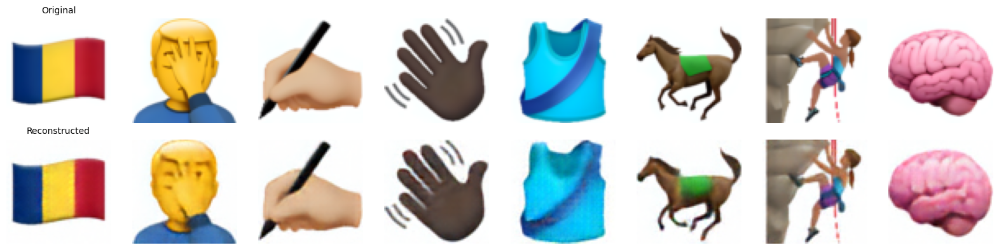


FID hasn't improved in 100 epochs and reached 74.27


Epoch [341/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000017

FID hasn't improved in 100 epochs and reached 74.27


Epoch [342/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000016

FID hasn't improved in 100 epochs and reached 74.27


Epoch [343/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000016

FID hasn't improved in 100 epochs and reached 74.27


Epoch [344/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000015

FID hasn't improved in 100 epochs and reached 74.27


Epoch [345/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000015

FID hasn't improved in 100 epochs and reached 74.27


Epoch [346/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000014

FID hasn't improved in 100 epochs and reached 74.27


Epoch [347/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000014

FID hasn't improved in 100 epochs and reached 74.27


Epoch [348/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000013

FID hasn't improved in 100 epochs and reached 74.27


Epoch [349/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000013

FID hasn't improved in 100 epochs and reached 74.27


Epoch [350/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000012
Checkpoint saved at epoch 350


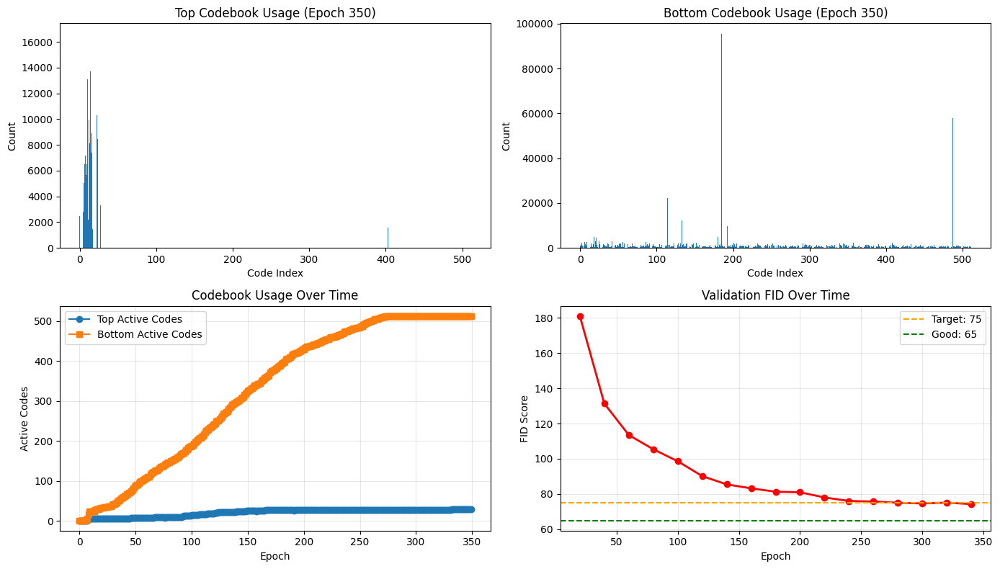


FID hasn't improved in 100 epochs and reached 74.27


Epoch [351/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000012

FID hasn't improved in 100 epochs and reached 74.27


Epoch [352/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000011

FID hasn't improved in 100 epochs and reached 74.27


Epoch [353/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000011

FID hasn't improved in 100 epochs and reached 74.27


Epoch [354/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000011

FID hasn't improved in 100 epochs and reached 74.27


Epoch [355/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000010

FID hasn't improved in 100 epochs and reached 74.27


Epoch [356/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000010

FID hasn't improved in 100 epochs and reached 74.27


Epoch [357/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000009

FID hasn't improved in 100 epochs and reached 74.27


Epoch [358/500] Loss: 0.0055 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000009

FID hasn't improved in 100 epochs and reached 74.27


Epoch [359/500] Loss: 0.0055 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000009

FID hasn't improved in 100 epochs and reached 74.27


Epoch [360/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000008


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmpdo9mbvsh" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmplov8mi1_" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 74.24601965650788



Validation Metrics (Epoch 360):
  Loss: 0.0068 | Recon: 0.0057 | VQ: 0.0011
  MSE: 0.005715 | PSNR: 31.9726 dB | SSIM: 0.9351 | FID: 74.2460

 New best FID: 74.25 - Model saved!


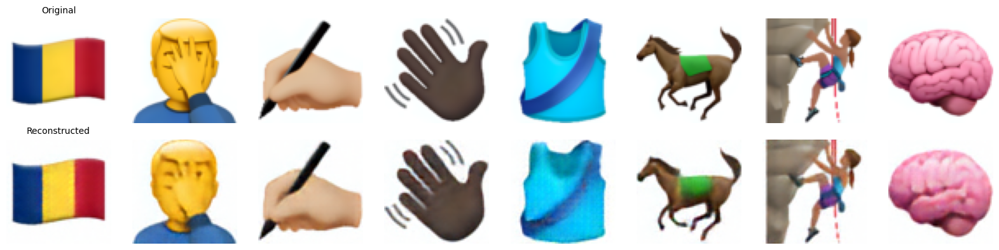


FID hasn't improved in 100 epochs and reached 74.25


Epoch [361/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000008

FID hasn't improved in 100 epochs and reached 74.25


Epoch [362/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000008

FID hasn't improved in 100 epochs and reached 74.25


Epoch [363/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000007

FID hasn't improved in 100 epochs and reached 74.25


Epoch [364/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000007

FID hasn't improved in 100 epochs and reached 74.25


Epoch [365/500] Loss: 0.0055 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000007

FID hasn't improved in 100 epochs and reached 74.25


Epoch [366/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000006

FID hasn't improved in 100 epochs and reached 74.25


Epoch [367/500] Loss: 0.0057 | Recon: 0.0046 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000006

FID hasn't improved in 100 epochs and reached 74.25


Epoch [368/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000006

FID hasn't improved in 100 epochs and reached 74.25


Epoch [369/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000005

FID hasn't improved in 100 epochs and reached 74.25


Epoch [370/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000005

FID hasn't improved in 100 epochs and reached 74.25


Epoch [371/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000005

FID hasn't improved in 100 epochs and reached 74.25


Epoch [372/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000005

FID hasn't improved in 100 epochs and reached 74.25


Epoch [373/500] Loss: 0.0056 | Recon: 0.0045 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000004

FID hasn't improved in 100 epochs and reached 74.25


Epoch [374/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000004

FID hasn't improved in 100 epochs and reached 74.25


Epoch [375/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000004

FID hasn't improved in 100 epochs and reached 74.25


Epoch [376/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000004

FID hasn't improved in 100 epochs and reached 74.25


Epoch [377/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000003

FID hasn't improved in 100 epochs and reached 74.25


Epoch [378/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000003

FID hasn't improved in 100 epochs and reached 74.25


Epoch [379/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000003

FID hasn't improved in 100 epochs and reached 74.25


Epoch [380/500] Loss: 0.0055 | Recon: 0.0044 | VQ: 0.0011 | Top: 29/512 | Bottom: 512/512 | LR: 0.000003


Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "/tmp/tmpe19phatm" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Extracting statistics from input 2
Looking for samples non-recursivelty in "/tmp/tmplc0vd9aw" with extensions png,jpg,jpeg
Found 248 samples
Processing samples
Frechet Inception Distance: 73.72006138650517



Validation Metrics (Epoch 380):
  Loss: 0.0068 | Recon: 0.0057 | VQ: 0.0011
  MSE: 0.005713 | PSNR: 31.9741 dB | SSIM: 0.9353 | FID: 73.7201

 New best FID: 73.72 - Model saved!


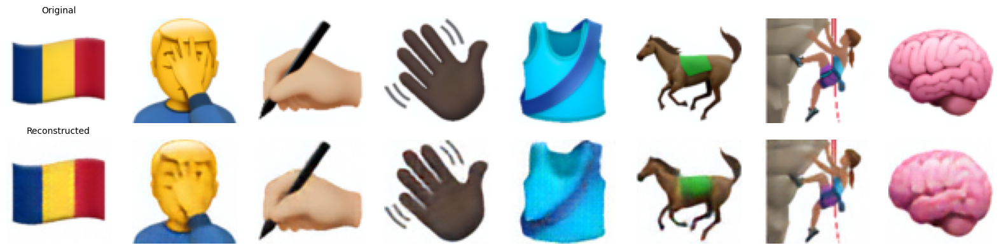


FID hasn't improved in 100 epochs and reached 73.72


KeyboardInterrupt: 

In [ ]:
from tqdm import tqdm
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import os
import tempfile
import torch_fidelity
from torchvision.utils import save_image
from torchmetrics import MeanSquaredError, PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure

num_epochs = 500

# Track metrics across epochs
top_usage_history = []
bottom_usage_history = []
train_loss_history = []
val_fid_history = []
val_ssim_history = []
val_psnr_history = []
best_fid = float('inf')

# Define metric calculators
mse_metric = MeanSquaredError()
psnr_metric = PeakSignalNoiseRatio()
ssim_metric = StructuralSimilarityIndexMeasure()


# Function to calculate MSE, PSNR, SSIM
def calculate_image_metrics(original_images, reconstructed_images, device):
    original_images = original_images.float().to(device)
    reconstructed_images = reconstructed_images.float().to(device)

    mse_metric.to(device)
    psnr_metric.to(device)
    ssim_metric.to(device)

    mse_value = mse_metric(reconstructed_images, original_images)
    psnr_value = psnr_metric(reconstructed_images, original_images)
    ssim_value = ssim_metric(reconstructed_images, original_images)

    return mse_value.item(), psnr_value.item(), ssim_value.item()

# Function to calculate FID
def calculate_fid(original_images_list, reconstructed_images_list, device):
    with tempfile.TemporaryDirectory() as original_dir, \
         tempfile.TemporaryDirectory() as reconstructed_dir:

        # Iterate through the image lists and save images
        for i, (original_batch, reconstructed_batch) in enumerate(zip(original_images_list, reconstructed_images_list)):
            for j in range(original_batch.shape[0]):
                 # Denormalize images before saving for FID calculation
                original_img = original_batch[j] * 0.5 + 0.5
                reconstructed_img = reconstructed_batch[j] * 0.5 + 0.5

                save_image(original_img, os.path.join(original_dir, f"original_{i}_{j}.png"))
                save_image(reconstructed_img, os.path.join(reconstructed_dir, f"reconstructed_{i}_{j}.png"))


        metrics_dict = torch_fidelity.calculate_metrics(
            input1=original_dir,
            input2=reconstructed_dir,
            cuda=device.type == 'cuda',
            isc=False,
            fid=True,
            kid=False,
            prdc=False,
        )

        return metrics_dict['frechet_inception_distance']


# Validation function
def validate(model, val_loader, device, epoch):
    model.eval()

    val_loss = 0.0
    val_recon_loss = 0.0
    val_vq_loss = 0.0

    # For FID/SSIM calculation
    all_original = []
    all_reconstructed = []

    with torch.no_grad():
        for batch in val_loader:
            images = batch['image'].to(device)

            # Forward pass
            reconstructed_images, diff = model(images)

            # Compute losses
            reconstruction_loss = F.mse_loss(reconstructed_images, images)
            vq_loss = diff * 0.25
            loss = reconstruction_loss + vq_loss

            val_loss += loss.item()
            val_recon_loss += reconstruction_loss.item()
            val_vq_loss += vq_loss.item()

            # Store for metric calculation
            all_original.append(images.cpu())
            all_reconstructed.append(reconstructed_images.cpu())

    # Calculate metrics
    avg_val_loss = val_loss / len(val_loader)
    avg_val_recon = val_recon_loss / len(val_loader)
    avg_val_vq = val_vq_loss / len(val_loader)

    # Concatenate for overall metrics
    concatenated_original = torch.cat(all_original, dim=0)
    concatenated_reconstructed = torch.cat(all_reconstructed, dim=0)

    # Calculate image quality metrics (MSE, PSNR, SSIM)
    mse_score, psnr_score, ssim_score = calculate_image_metrics(concatenated_original, concatenated_reconstructed, device)

    # Calculate FID
    fid_score = calculate_fid(all_original, all_reconstructed, device)


    print(f"\n{'='*60}")
    print(f"Validation Metrics (Epoch {epoch+1}):")
    print(f"  Loss: {avg_val_loss:.4f} | Recon: {avg_val_recon:.4f} | VQ: {avg_val_vq:.4f}")
    print(f"  MSE: {mse_score:.6f} | PSNR: {psnr_score:.4f} dB | SSIM: {ssim_score:.4f} | FID: {fid_score:.4f}")
    print(f"{'='*60}\n")

    model.train()

    return {
        'loss': avg_val_loss,
        'mse': mse_score,
        'psnr': psnr_score,
        'ssim': ssim_score,
        'fid': fid_score
    }

for epoch in range(num_epochs):
    model.train()
    total_loss = 0.0
    recon_loss_sum = 0.0
    vq_loss_sum = 0.0

    # Track which codes are used this epoch
    epoch_top_codes = []
    epoch_bottom_codes = []

    pbar = tqdm(train_dataloader, desc=f"Epoch [{epoch+1}/{num_epochs}]", leave=False)

    for batch in pbar:
        images = batch['image'].to(device)

        # Forward pass
        reconstructed_images, diff = model(images)

        # Get the discrete codes
        with torch.no_grad():
            _, _, _, id_t, id_b = model.encode(images)
            epoch_top_codes.append(id_t.cpu())
            epoch_bottom_codes.append(id_b.cpu())

        # Compute losses
        reconstruction_loss = criterion(reconstructed_images, images)
        vq_loss = diff * 0.25
        loss = reconstruction_loss + vq_loss

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        # Track metrics
        total_loss += loss.item()
        recon_loss_sum += reconstruction_loss.item()
        vq_loss_sum += vq_loss.item()

        # Update tqdm description
        pbar.set_postfix({
            "Loss": f"{loss.item():.4f}",
            "Recon": f"{reconstruction_loss.item():.4f}",
            "VQ": f"{vq_loss.item():.4f}"
        })

    # Update learning rate scheduler
    scheduler.step()

    # Calculate codebook usage for this epoch
    all_top_codes = torch.cat([c.flatten() for c in epoch_top_codes])
    all_bottom_codes = torch.cat([c.flatten() for c in epoch_bottom_codes])

    n_embed = 512

    top_counts = torch.bincount(all_top_codes, minlength=n_embed)
    bottom_counts = torch.bincount(all_bottom_codes, minlength=n_embed)

    top_active = (top_counts > 0).sum().item()
    bottom_active = (bottom_counts > 0).sum().item()

    # Store usage statistics
    top_usage_history.append(top_active)
    bottom_usage_history.append(bottom_active)

    # Epoch summary
    avg_loss = total_loss / len(train_dataloader)
    avg_recon_loss = recon_loss_sum / len(train_dataloader)
    avg_vq_loss = vq_loss_sum / len(train_dataloader)
    train_loss_history.append(avg_loss)

    print(f"Epoch [{epoch+1}/{num_epochs}] "
          f"Loss: {avg_loss:.4f} | Recon: {avg_recon_loss:.4f} | VQ: {avg_vq_loss:.4f} | "
          f"Top: {top_active}/{n_embed} | Bottom: {bottom_active}/{n_embed} | "
          f"LR: {optimizer.param_groups[0]['lr']:.6f}")

    # VALIDATION EVERY 20 EPOCHS
    if (epoch + 1) % 20 == 0:
        val_metrics = validate(model, validation_dataloader, device, epoch)
        val_fid_history.append((epoch+1, val_metrics['fid']))
        val_ssim_history.append((epoch+1, val_metrics['ssim']))
        val_psnr_history.append((epoch+1, val_metrics['psnr']))

        # Save best model based on FID
        if val_metrics['fid'] < best_fid:
            best_fid = val_metrics['fid']
            torch.save({
                'epoch': epoch + 1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'fid': best_fid,
                'ssim': val_metrics['ssim'],
                'psnr': val_metrics['psnr'],
            }, f'vqvae_best_fid{best_fid:.1f}_epoch{epoch+1}.pt')
            print(f" New best FID: {best_fid:.2f} - model saved")

        visualize_reconstructions(model, validation_dataloader, device, num_samples=8)

    # SAVE CHECKPOINT EVERY 50 EPOCHS
    if (epoch + 1) % 50 == 0:
        torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'train_loss_history': train_loss_history,
            'val_fid_history': val_fid_history,
            'top_usage_history': top_usage_history,
            'bottom_usage_history': bottom_usage_history,
        }, f'vqvae_checkpoint_epoch{epoch+1}.pt')
        print(f"Checkpoint saved at epoch {epoch+1}")

    # VISUALIZE CODEBOOK USAGE EVERY 50 EPOCHS
    if (epoch + 1) % 50 == 0:
        import matplotlib.pyplot as plt

        fig, axes = plt.subplots(2, 2, figsize=(14, 8))

        # Top codebook usage
        axes[0, 0].bar(range(n_embed), top_counts.cpu().numpy())
        axes[0, 0].set_title(f'Top Codebook Usage (Epoch {epoch+1})')
        axes[0, 0].set_xlabel('Code Index')
        axes[0, 0].set_ylabel('Count')

        # Bottom codebook usage
        axes[0, 1].bar(range(n_embed), bottom_counts.cpu().numpy())
        axes[0, 1].set_title(f'Bottom Codebook Usage (Epoch {epoch+1})')
        axes[0, 1].set_xlabel('Code Index')
        axes[0, 1].set_ylabel('Count')

        # Usage trend over time
        axes[1, 0].plot(top_usage_history, label='Top Active Codes', marker='o')
        axes[1, 0].plot(bottom_usage_history, label='Bottom Active Codes', marker='s')
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].set_ylabel('Active Codes')
        axes[1, 0].set_title('Codebook Usage Over Time')
        axes[1, 0].legend()
        axes[1, 0].grid(True, alpha=0.3)

        # FID trend over time
        if val_fid_history:
            epochs_val, fids = zip(*val_fid_history)
            axes[1, 1].plot(epochs_val, fids, marker='o', color='red', linewidth=2)
            axes[1, 1].set_xlabel('Epoch')
            axes[1, 1].set_ylabel('FID Score')
            axes[1, 1].set_title('Validation FID Over Time')
            axes[1, 1].grid(True, alpha=0.3)
            axes[1, 1].axhline(y=75, color='orange', linestyle='--', label='Target: 75')
            axes[1, 1].axhline(y=65, color='green', linestyle='--', label='Good: 65')
            axes[1, 1].legend()

        plt.tight_layout()
        plt.savefig(f'training_progress_epoch{epoch+1}.png', dpi=150)
        plt.show()


print("\n" + "="*60)
print("Training finished!")
print("="*60)

# Final statistics
print(f"\nFinal Codebook Usage:")
print(f"  Top: {top_usage_history[-1]}/{n_embed} codes ({100*top_usage_history[-1]/n_embed:.1f}%)")
print(f"  Bottom: {bottom_usage_history[-1]}/{n_embed} codes ({100*bottom_usage_history[-1]/n_embed:.1f}%)")
print(f"\nBest Validation FID: {best_fid:.2f}")
print(f"Final Training Loss: {train_loss_history[-1]:.4f}")

# final training curves
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(14, 4))

# Training loss
axes[0].plot(train_loss_history, linewidth=2)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Training Loss')
axes[0].set_title('Training Loss Over Time')
axes[0].grid(True, alpha=0.3)

# Validation FID
if val_fid_history:
    epochs_val, fids = zip(*val_fid_history)
    axes[1].plot(epochs_val, fids, marker='o', color='red', linewidth=2)
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('FID Score')
    axes[1].set_title('Validation FID Over Time')
    axes[1].grid(True, alpha=0.3)
    axes[1].axhline(y=best_fid, color='green', linestyle='--', label=f'Best: {best_fid:.2f}')
    axes[1].legend()

plt.tight_layout()
plt.savefig('final_training_curves.png', dpi=150)
plt.show()

In [ ]:
import torch
from tqdm import tqdm

top_codes = []
bottom_codes = []
model.eval()

with torch.no_grad():
    for batch in tqdm(train_dataloader):
        images = batch['image'].to(device)

        _, _, _, id_t, id_b = model.encode(images)

        top_codes.append(id_t.cpu())
        bottom_codes.append(id_b.cpu())

all_top_codes = torch.cat(top_codes, dim=0)
all_bottom_codes = torch.cat(bottom_codes, dim=0)

print(f"Final shape of top codes: {all_top_codes.shape}")
print(f"Final shape of bottom codes: {all_bottom_codes.shape}")

torch.save({"top": all_top_codes, "bottom": all_bottom_codes}, "latent_codes_trial_6.pt")

100%|██████████| 79/79 [00:09<00:00,  8.52it/s]

Final shape of top codes: torch.Size([2501, 8, 8])
Final shape of bottom codes: torch.Size([2501, 16, 16])
